In [233]:
import h5py
import numpy as np
from scipy.optimize import curve_fit
import plotly
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt
import os
import re
from decimal import Decimal


def fit_ImSigma_4(iw, gamma, alpha, beta, delta, delta2):
    ImSigma = -gamma - alpha * iw - beta * iw**2 - delta * iw**3 - delta2 * iw**4
    return ImSigma

def fit_ImSigma_3(iw, gamma, alpha, beta, delta):
    ImSigma = -gamma - alpha * iw - beta * iw**2 - delta * iw**3
    return ImSigma

def fit_ImSigma_2(iw, gamma, alpha, beta):
    ImSigma = -gamma - alpha * iw - beta * iw**2
    return ImSigma

def fit_ImSigma_1(iw, gamma, alpha):
    ImSigma = gamma - alpha * iw
    return ImSigma

# frequencies = ["lam_100"]
# frequencies = ["w0_2"]
frequencies = ["w0_4"]
data_np = {}
data_np[frequencies[0]] = {}
# data_np["w0_2"] = {}
data = {}
# data["w0_4"] = {}
data[frequencies[0]] = {}
Ulim = 2380
beta = 30

for freq in frequencies:
    # PATH = "/mnt/data/BACKUP/daniel/Data/DynamicalU_Susceptibility/PhaseSpace/Ust_vs_Usc/beta30/"+freq
    PATH = f"/mnt/scratch/daniel/Data/DynamicalU_Susceptibility/PhaseSpace/Ust_vs_Usc/beta{beta}/"+freq
    # /mnt/scratch/daniel/Data/DynamicalU_Susceptibility/PhaseSpace/Ust_vs_Usc/beta30/w0_4
    # print(PATH)
    U_st = []
    U_sc = []
    ivmaxs = []
    iv0s = []
    popt2s = []
    fitpoints = 3

    for subdir, dirs, files in os.walk(PATH):
        for file in files:
            # print(subdir)
            if frequencies[0][0] == "w":
                # print(subdir)
                # print(re.findall(r'\d+', subdir))
                U1 = re.findall(r'\d+', subdir)[3]
                U2 = re.findall(r'\d+', subdir)[4]
                # print(U1, U2)
                # U1 = re.findall(r'\d+', subdir)[5]
                # U2 = re.findall(r'\d+', subdir)[6]
            if frequencies[0][0] == "l":
                U1 = re.findall(r'\d+', subdir)[3]
                U2 = re.findall(r'\d+', subdir)[4]

            # print(U1, U2)
            if int(U2) < Ulim:
                # print(U1, U2)
                if int(U1) not in U_st and int(U1) != 919:
                    U_st.append(int(U1))
                if int(U2) not in U_sc:
                    U_sc.append(int(U2))

                if int(U1) != 919:
                    if str(U1) not in data[freq].keys():
                        data[freq][str(U1)] = {}
                    if str(U2) not in data[freq][str(U1)].keys():
                        data[freq][str(U1)][str(U2)] = {}

                    data[freq][str(U1)][str(U2)]["iv"] = 0
                    data[freq][str(U1)][str(U2)]["mu"] = 0
                    data[freq][str(U1)][str(U2)]["siv"] = 0
                    data[freq][str(U1)][str(U2)]["gtau"] = 0
                    data[freq][str(U1)][str(U2)]["Z"] = 0
                    data[freq][str(U1)][str(U2)]["scat"] = 0
                    data[freq][str(U1)][str(U2)]["alpha"] = 0
                    data[freq][str(U1)][str(U2)]["doubleocc"] = 0
                    data[freq][str(U1)][str(U2)]["szsz"] = 0
                    data[freq][str(U1)][str(U2)]["exists"] = 0
            
    for subdir, dirs, files in os.walk(PATH):
        # print(files)
        for file in files:
            if frequencies[0][0] == "w":
                U1 = re.findall(r'\d+', subdir)[3]
                U2 = re.findall(r'\d+', subdir)[4]
            if frequencies[0][0] == "l":
                U1 = re.findall(r'\d+', subdir)[3]
                U2 = re.findall(r'\d+', subdir)[4]

            if int(U2) < Ulim and int(U1) < 2220 and int(U1) != 919:
                if beta == 30:
                    if int(U1)<1250:
                        if freq == "w0_4": lpt = "oo_2"
                        if freq == "w0_2": lpt = "oo_2"
                    if int(U1)>1250:
                        if freq == "w0_4": lpt = "oo_3"
                        if freq == "w0_2": lpt = "oo_3"
                if beta == 20:
                    if int(U1)<1250:
                        if freq == "w0_4": lpt = "oo_2"
                        if freq == "w0_2": lpt = "oo_4"
                    if int(U1)>1250:
                        if freq == "w0_4": lpt = "oo_3"
                        if freq == "w0_2": lpt = "oo_3"
                lpt = "oo_5"

                if lpt in file:# or "oo_3" in file:
                    filename = subdir+'/'+file
                    # print(U1,U2,filename)
                    with h5py.File(filename, "r") as f:
                        if 'dmft-last' in f.keys():
                            # print(U1,U2, file)
                            data[freq][str(U1)][str(U2)]["exists"] = 1
                            iv = np.array(f['.axes']['iw'][:])
                            tau = np.array(f['.axes']['tau'][:])
                            mu = np.array(f['dmft-last']['ineq-001']['muimp']['value'])
                            siv = np.array(f['dmft-last']['ineq-001']['siw']['value'])
                            giv = np.array(f['dmft-last']['ineq-001']['giw']['value'])
                            gtau = np.array(f['dmft-last']['ineq-001']['gtau']['value'])
                            # doubleocc = np.array(f['dmft-last']['ineq-001']['ntau-n0']['value'][0,0,0,1,0])
                            doubleocc = np.array(f['dmft-last']['ineq-001']['occ']['value'][0,0,0,1])
                            # sztausz0 = np.array(f['dmft-last']['ineq-001']['sztau-sz0']['value'][0,0,0,1,0])
                            # print(np.array(f['dmft-last']['ineq-001']['ntau-n0']['value'][0,0,0,1,0]))
                            szsz = np.array(np.sum ( f['dmft-last']['ineq-001']['ntau-n0']['value'][0,0,0,0,:] + f['dmft-last']['ineq-001']['ntau-n0']['value'][0,1,0,1,:] - f['dmft-last']['ineq-001']['ntau-n0']['value'][0,0,0,1,:] - f['dmft-last']['ineq-001']['ntau-n0']['value'][0,1,0,0,:] )*beta/1000 )
                            szsz_tau = np.array(( f['dmft-last']['ineq-001']['ntau-n0']['value'][0,0,0,0,:] + f['dmft-last']['ineq-001']['ntau-n0']['value'][0,1,0,1,:] - f['dmft-last']['ineq-001']['ntau-n0']['value'][0,0,0,1,:] - f['dmft-last']['ineq-001']['ntau-n0']['value'][0,1,0,0,:] ))
                            szszb2 = np.array( ( f['dmft-last']['ineq-001']['ntau-n0']['value'][0,0,0,0,500] + f['dmft-last']['ineq-001']['ntau-n0']['value'][0,1,0,1,500] - f['dmft-last']['ineq-001']['ntau-n0']['value'][0,0,0,1,500] - f['dmft-last']['ineq-001']['ntau-n0']['value'][0,1,0,0,500] ) )
                            nch = np.array(np.sum ( f['dmft-last']['ineq-001']['ntau-n0']['value'][0,0,0,0,:] + f['dmft-last']['ineq-001']['ntau-n0']['value'][0,1,0,1,:] + f['dmft-last']['ineq-001']['ntau-n0']['value'][0,0,0,1,:] + f['dmft-last']['ineq-001']['ntau-n0']['value'][0,1,0,0,:] )*beta/1000 )
                            # szszsz = np.array( ( f['dmft-last']['ineq-001']['ntau-n0']['value'][0,0,0,0,:] + f['dmft-last']['ineq-001']['ntau-n0']['value'][0,1,0,1,:] - f['dmft-last']['ineq-001']['ntau-n0']['value'][0,0,0,1,:] - f['dmft-last']['ineq-001']['ntau-n0']['value'][0,1,0,0,:] ) )
                            # ntaunntau = np.array(f['dmft-last']['ineq-001']['ntau-n0']['value'])
                            iv0 = int(iv.shape[0]/2)
                            nn = iv0 + fitpoints
                            ivmax = iv0 + 10
                            iv_limit = iv[iv0:nn].real
                            siv_limit = (siv[0,0,iv0:nn]).imag

                #             popt2, pcov2 = curve_fit(fit_ImSigma_1, iv_limit, siv_limit)
                #             popt2, pcov2 = curve_fit(fit_ImSigma_2, iv_limit, siv_limit)

                            popt2, pcov2 = curve_fit(fit_ImSigma_1, iv_limit, siv_limit)
                            popt2s.append(popt2)

                #             fit_sigma_2 = fit_ImSigma_1(iv_limit, popt2[0], popt2[1])
                #             fit_sigma_2 = fit_ImSigma_2(iv_limit, popt2[0], popt2[1], popt2[2])
                            # fit_sigma_2 = fit_ImSigma_4(iv_limit, popt2[0], popt2[1], popt2[2], popt2[3], popt2[4])

                    data[freq][str(U1)][str(U2)]["mu"] = mu
                    data[freq][str(U1)][str(U2)]["iv"] = iv
                    data[freq][str(U1)][str(U2)]["siv"] = siv
                    data[freq][str(U1)][str(U2)]["giv"] = giv
                    data[freq][str(U1)][str(U2)]["gtau"] = gtau
                    # data[freq][str(U1)][str(U2)]["fit_siv"] = fit_sigma_2
                    data[freq][str(U1)][str(U2)]["Z"] = round(1/(1+popt2[1]), 2)
                    data[freq][str(U1)][str(U2)]["scat"] = round(popt2[0])
                    data[freq][str(U1)][str(U2)]["alpha"] = popt2[1]
                    data[freq][str(U1)][str(U2)]["doubleocc"] = doubleocc
                    data[freq][str(U1)][str(U2)]["nch"] = nch
                    data[freq][str(U1)][str(U2)]["szsz"] = szsz
                    data[freq][str(U1)][str(U2)]["szsz_tau"] = szsz_tau
                    data[freq][str(U1)][str(U2)]["szszb2"] = szszb2
                    data[freq][str(U1)][str(U2)]["gtaubetahalf"] = gtau[0,0,500]
                    
                    # if int(U2)>200:
                    #     print(U1,U2,data[freq][str(U1)][str(U2)]["Z"])
                        

    f = h5py.File(filename, "r")

    U_sc.sort()
    U_st.sort()

    data_np[freq]["Z"] = np.zeros((len(U_st), len(U_sc),3))
    data_np[freq]["scat"] = np.zeros((len(U_st), len(U_sc),3))
    data_np[freq]["alpha"] = np.zeros((len(U_st), len(U_sc),3))
    data_np[freq]["siv0"] = np.zeros((len(U_st), len(U_sc),3), dtype=complex)
    data_np[freq]["siv_diff"] = np.zeros((len(U_st), len(U_sc),3), dtype=complex)
    data_np[freq]["gtaubetahalf"] = np.zeros((len(U_st), len(U_sc),3))
    data_np[freq]["doubleocc"] = np.zeros((len(U_st), len(U_sc),3))
    data_np[freq]["nch"] = np.zeros((len(U_st), len(U_sc),3))
    data_np[freq]["szsz"] = np.zeros((len(U_st), len(U_sc),3))
    data_np[freq]["szsz_tau"] = np.zeros((len(U_st), len(U_sc),1001))
    data_np[freq]["siv"] = np.zeros((len(U_st), len(U_sc),2000), dtype=complex)
    data_np[freq]["giv"] = np.zeros((len(U_st), len(U_sc),2000), dtype=complex)
    data_np[freq]["mu"] = np.zeros((len(U_st), len(U_sc),1), dtype=complex)

#     print(U_st)
#     print(U_sc)
    k = 0
    for u in U_st:
        if str(u) in data[freq].keys():
            l = 0
            for v in U_sc:
                if str(v) in data[freq][str(u)].keys():
                    if data[freq][str(u)][str(v)]["exists"]==1:
                        # print(u,v)
                        data_np[freq]["Z"][k,l,0] = u
                        data_np[freq]["Z"][k,l,1] = v
                        data_np[freq]["Z"][k,l,2] = data[freq][str(u)][str(v)]["Z"]
        
                        data_np[freq]["scat"][k,l,0] = u
                        data_np[freq]["scat"][k,l,1] = v
                        data_np[freq]["scat"][k,l,2] = data[freq][str(u)][str(v)]["scat"]
        
                        data_np[freq]["alpha"][k,l,0] = u
                        data_np[freq]["alpha"][k,l,1] = v
                        data_np[freq]["alpha"][k,l,2] = data[freq][str(u)][str(v)]["alpha"]
        
                        data_np[freq]["siv0"][k,l,0] = u
                        data_np[freq]["siv0"][k,l,1] = v
                        data_np[freq]["siv0"][k,l,2] = data[freq][str(u)][str(v)]["siv"][0,0,1000]
        
                        data_np[freq]["siv_diff"][k,l,0] = u
                        data_np[freq]["siv_diff"][k,l,1] = v
                        data_np[freq]["siv_diff"][k,l,2] = data[freq][str(u)][str(v)]["siv"][0,0,1001] - data[freq][str(u)][str(v)]["siv"][0,0,1000]
        
                        data_np[freq]["gtaubetahalf"][k,l,0] = u
                        data_np[freq]["gtaubetahalf"][k,l,1] = v
                        data_np[freq]["gtaubetahalf"][k,l,2] = data[freq][str(u)][str(v)]["gtau"][0,0,500]
        
                        data_np[freq]["doubleocc"][k,l,0] = u
                        data_np[freq]["doubleocc"][k,l,1] = v
                        data_np[freq]["doubleocc"][k,l,2] = data[freq][str(u)][str(v)]["doubleocc"]
        
                        data_np[freq]["nch"][k,l,0] = u
                        data_np[freq]["nch"][k,l,1] = v
                        data_np[freq]["nch"][k,l,2] = data[freq][str(u)][str(v)]["nch"]
        
                        data_np[freq]["szsz"][k,l,0] = u
                        data_np[freq]["szsz"][k,l,1] = v
                        data_np[freq]["szsz"][k,l,2] = data[freq][str(u)][str(v)]["szsz"]

                        data_np[freq]["szsz_tau"][k,l,:] = data[freq][str(u)][str(v)]["szsz_tau"]

                        data_np[freq]["siv"][k,l,:] = data[freq][str(u)][str(v)]["siv"][0,0,:]
                        data_np[freq]["giv"][k,l,:] = data[freq][str(u)][str(v)]["giv"][0,0,:]
                        data_np[freq]["mu"][k,l] = data[freq][str(u)][str(v)]["mu"][0,0]

                    else:
                        # print(u,v, " NO ")
                        data_np[freq]["Z"][k,l,0] = u
                        data_np[freq]["Z"][k,l,1] = v
                        data_np[freq]["Z"][k,l,2] = -0.5

                        data_np[freq]["scat"][k,l,0] = u
                        data_np[freq]["scat"][k,l,1] = v
                        data_np[freq]["scat"][k,l,2] = -0.5
        
                        data_np[freq]["alpha"][k,l,0] = u
                        data_np[freq]["alpha"][k,l,1] = v
                        data_np[freq]["alpha"][k,l,2] = -0.5
        
                        data_np[freq]["siv0"][k,l,0] = u
                        data_np[freq]["siv0"][k,l,1] = v
                        data_np[freq]["siv0"][k,l,2] = -0.5
        
                        data_np[freq]["siv_diff"][k,l,0] = u
                        data_np[freq]["siv_diff"][k,l,1] = v
                        data_np[freq]["siv_diff"][k,l,2] = -0.5
        
                        data_np[freq]["gtaubetahalf"][k,l,0] = u
                        data_np[freq]["gtaubetahalf"][k,l,1] = v
                        data_np[freq]["gtaubetahalf"][k,l,2] = -0.5
        
                        data_np[freq]["doubleocc"][k,l,0] = u
                        data_np[freq]["doubleocc"][k,l,1] = v
                        data_np[freq]["doubleocc"][k,l,2] = 0
        
                        data_np[freq]["nch"][k,l,0] = u
                        data_np[freq]["nch"][k,l,1] = v
                        data_np[freq]["nch"][k,l,2] = 0
        
                        data_np[freq]["szsz"][k,l,0] = u
                        data_np[freq]["szsz"][k,l,1] = v
                        data_np[freq]["szsz"][k,l,2] = 0
                l+=1
        k+=1
    data_np[freq]["Z"][:,:,2][data_np[freq]["Z"][:,:,2]<0] = 0.0
    data_np[freq]["Z"][:,:,2][data_np[freq]["Z"][:,:,2]>1] = 0.0
    
# print(data_np[freq]["Z"].shape)
# print(data[freq][str(680)][str(180)]["szsz"])
# print(len(U_sc))
# print(len(U_st))
# print((U_sc))
# print((U_st))
# print(data_np[freq]["Z"][:,:,2])
# print(data_np[freq]["Z"][:,:,1])
# print(data_np[freq]["Z"][:,:,2].shape)

# print(data[frequencies[0]].keys())
# print(data[frequencies[0]]["920"].keys())

# print(data_np[freq]["Z"][0,0,0])
# print(data_np[freq]["Z"][0,0,1])
# print(data_np[freq]["Z"][0,0,2])

# print(data_np[freq]["doubleocc"][0,0,0])
# print(data_np[freq]["doubleocc"][0,0,1])
# print(data_np[freq]["doubleocc"][0,0,2])

print(data[freq][str(200)][str(200)]["szszb2"])
# print(data[freq][str(200)][str(200)]["szsz_tau"])
print(data[freq][str(200)][str(200)]["szsz"])
# data_np[freq]["szsz"][k,l,2]
# print(gtau.shape)

0.0
0.0


dict_keys(['0', '20', '40', '60', '80', '100', '120', '140', '160', '180', '200', '220', '240', '260', '280', '300', '320', '340', '360', '380', '400', '420', '440', '460', '480', '500', '520', '540', '560', '580', '600', '620', '640', '660', '680', '700', '720', '740', '760', '780', '800', '820', '840', '860', '880', '900', '920', '940', '960', '980', '1000', '1020', '1040', '1060', '1080', '1100', '1120', '1140', '1160', '1180', '1200', '1220', '1240', '1260', '1280', '1300', '1320', '1340', '1360', '1380', '1400', '1420', '1440', '1460', '1480', '1500', '1520', '1540', '1560', '1580', '1600'])


(-0.5, 50.0)

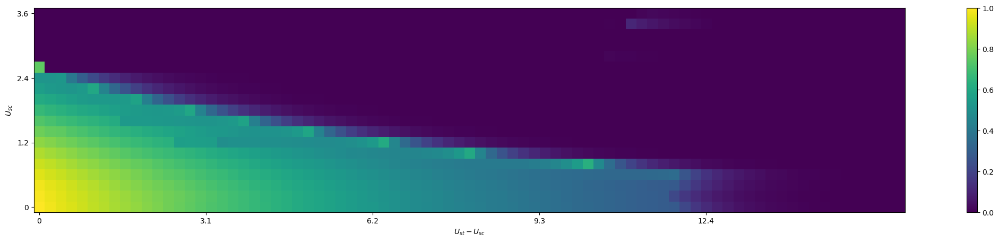

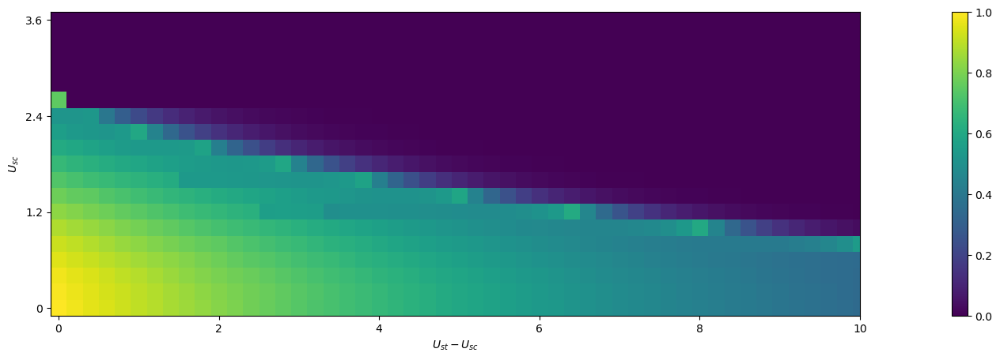

In [234]:
# print(data["w0_2"].keys())
# print(data["w0_2"]["1000"].keys())
data_alt = {}
steps = np.linspace(0,80,81, dtype=int)
Ualt = 1600-steps*20
# print(Ualt)

for sc in U_sc:
    data_alt[str(sc)] = {}
    for n in steps:
        data_alt[str(sc)][str(n*20)] = {}
        data_alt[str(sc)][str(n*20)]["Z"] = 0
        # data_alt[str(sc)][str(1160-200-n*20)]["Z"] = 
print(data_alt["0"].keys())

l = 0
for st in data[freq].keys():
    k = 0
    for sc in data[freq][st]:
        # print(st, sc)
        if int(st)-int(sc)>-1 and data[frequencies[0]][str(st)][str(sc)]["Z"] > 0 and data[frequencies[0]][str(st)][str(sc)]["Z"] <= 1:
            # print(sc,st-sc)
            data_alt[str(sc)][str(int(st)-int(sc))]["Z"] = data[frequencies[0]][str(st)][str(sc)]["Z"]
            # print(st,sc,data[frequencies[0]][str(st)][str(sc)]["Z"])
            
# print(data[freq].keys())            
for sc in U_sc:
    if int(sc) < 111220:
        for st in U_st:
            if st-sc-60 > 0 and st not in [220,240,260,300,320,340]:# and st-sc-60 <1240:# and st > 360:
                # print(st, sc, st-sc)
                upper = data_alt[str(sc)][str(st-sc)]["Z"]
                lower = data_alt[str(sc)][str(st-sc-80)]["Z"]
                diff = (lower - upper) / 4
                data_alt[str(sc)][str(st-sc-20)]["Z"] = data_alt[str(sc)][str(st-sc)]["Z"] + 1*diff / 1
                data_alt[str(sc)][str(st-sc-40)]["Z"] = data_alt[str(sc)][str(st-sc)]["Z"] + 2*diff / 1
                data_alt[str(sc)][str(st-sc-60)]["Z"] = data_alt[str(sc)][str(st-sc)]["Z"] + 3*diff / 1
                # print(data_alt[str(sc)][str(st-sc)]["Z"], data_alt[str(sc)][str(st-sc-20)]["Z"], data_alt[str(sc)][str(st-sc-40)]["Z"], data_alt[str(sc)][str(st-sc-60)]["Z"], data_alt[str(sc)][str(st-sc-80)]["Z"])

# print(data_alt.keys())
# print(data_alt["200"].keys())
data_alt_np = np.zeros( (len(data_alt.keys()), len(data_alt["200"].keys()), 3) )

for m, k1 in enumerate(data_alt.keys()):
    for n, k2 in enumerate(data_alt[k1].keys()):
        # print(k1,k2, data_alt[k1][k2]["Z"])
        data_alt_np[m,n,0] = data_alt[k1][k2]["Z"]
        data_alt_np[m,n,1] = k1
        data_alt_np[m,n,2] = k2

data_alt_np[:,:,0][data_alt_np[:,:,0]<0] = 0.0
data_alt_np[:,:,0][data_alt_np[:,:,0]>1.1] = 0.0
data_alt_np_Z = data_alt_np

# print(data_alt_np[2,24,1:])
# print(data_alt_np[2,22,1:])
# print(data_alt_np[4,14,1:])
# print(data_alt_np[5,21,1:])
# print(data_alt_np[7,15,1:])
# data_alt_np[2,24,0] = 1
# data_alt_np[2,22,0] = 1
# data_alt_np[4,14,0] = 1
# data_alt_np[5,21,0] = 1
# data_alt_np[7,15,0] = 1

yticks = np.linspace(0,18,4)
yticklabels = [3.6,2.4,1.2,0]
xticks = np.linspace(0,62,5)
xticklabels = [0,3.1,6.2,9.3,12.4]

fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(30,5))
# ax.imshow((data_alt_np[:,:,0]))
pos = ax.imshow(np.flip(data_alt_np[:,:,0], axis=0))
ax.set_xticks(xticks)
ax.set_xticklabels(xticklabels)
ax.set_yticks(yticks)
ax.set_yticklabels(yticklabels)
ax.set_xlabel(r'$U_{st} - U_{sc}$')
ax.set_ylabel(r'$U_{sc}$')
fig.colorbar(pos, ax=ax)

xticks = np.linspace(0,50,6)
xticklabels = [0,2,4,6,8,10]
fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(30,5))
pos = ax.imshow(np.flip(data_alt_np[:,:,0], axis=0))
ax.set_xticks(xticks)
ax.set_xticklabels(xticklabels)
ax.set_yticks(yticks)
ax.set_yticklabels(yticklabels)
ax.set_xlabel(r'$U_{st} - U_{sc}$')
ax.set_ylabel(r'$U_{sc}$')
fig.colorbar(pos, ax=ax)
ax.set_xlim([-0.50,50.0])

In [235]:
# # print(data["w0_2"].keys())
# # print(data["w0_2"]["1000"].keys())
# data_alt = {}
# steps = np.linspace(0,80,81, dtype=int)
# Ualt = 1600-steps*20

# for sc in U_sc:
#     data_alt[str(sc)] = {}
#     for n in steps:
#         data_alt[str(sc)][str(n*20)] = {}
#         data_alt[str(sc)][str(n*20)]["gtaubetahalf"] = 0
#         # data_alt[str(sc)][str(1160-200-n*20)]["gtaubetahalf"] = 
# # print(data_alt["0"].keys())

# l = 0
# for st in data[freq].keys():
#     k = 0
#     for sc in data[freq][st]:
#         # print(st, sc)
#             # print(st, sc)
#             # print(data[frequencies[0]][str(st)][str(sc)]["gtaubetahalf"])
#         # if int(st)-int(sc)>-1 and data[frequencies[0]][str(st)][str(sc)]["gtaubetahalf"] > 0 and data[frequencies[0]][str(st)][str(sc)]["gtaubetahalf"] <= 1:
#             # print(sc,st-sc)
#             data_alt[str(sc)][str(int(st)-int(sc))]["gtaubetahalf"] = data[frequencies[0]][str(st)][str(sc)]["gtaubetahalf"]
#             # print(st,sc,data[frequencies[0]][str(st)][str(sc)]["gtaubetahalf"])
            
# # print(data[freq].keys())            
# for sc in U_sc:
#     if int(sc) < 111220:
#         for st in U_st:
#             if st-sc-60 > 0 and st not in [220,240,260,300,320,340]:# and st-sc-60 <1240:# and st > 360:
#                 # print(st, sc, st-sc)
#                 upper = data_alt[str(sc)][str(st-sc)]["gtaubetahalf"]
#                 lower = data_alt[str(sc)][str(st-sc-80)]["gtaubetahalf"]
#                 diff = (lower - upper) / 4
#                 data_alt[str(sc)][str(st-sc-20)]["gtaubetahalf"] = data_alt[str(sc)][str(st-sc)]["gtaubetahalf"] + 1*diff / 1
#                 data_alt[str(sc)][str(st-sc-40)]["gtaubetahalf"] = data_alt[str(sc)][str(st-sc)]["gtaubetahalf"] + 2*diff / 1
#                 data_alt[str(sc)][str(st-sc-60)]["gtaubetahalf"] = data_alt[str(sc)][str(st-sc)]["gtaubetahalf"] + 3*diff / 1
#                 # print(data_alt[str(sc)][str(st-sc)]["gtaubetahalf"], data_alt[str(sc)][str(st-sc-20)]["gtaubetahalf"], data_alt[str(sc)][str(st-sc-40)]["gtaubetahalf"], data_alt[str(sc)][str(st-sc-60)]["gtaubetahalf"], data_alt[str(sc)][str(st-sc-80)]["gtaubetahalf"])

# # print(data_alt.keys())
# # print(data_alt["200"].keys())
# data_alt_np = np.zeros( (len(data_alt.keys()), len(data_alt["200"].keys()), 3) )

# for m, k1 in enumerate(data_alt.keys()):
#     for n, k2 in enumerate(data_alt[k1].keys()):
#         # print(k1,k2, data_alt[k1][k2]["gtaubetahalf"])
#         data_alt_np[m,n,0] = data_alt[k1][k2]["gtaubetahalf"]
#         data_alt_np[m,n,1] = k1
#         data_alt_np[m,n,2] = k2

# data_alt_np[:,:,0][data_alt_np[:,:,0]<0] = 0.0
# data_alt_np[:,:,0][data_alt_np[:,:,0]>1.1] = 0.0
# data_alt_np_gtaubeta2 = data_alt_np

# # print(data_alt_np[2,24,1:])
# # print(data_alt_np[2,22,1:])
# # print(data_alt_np[4,14,1:])
# # print(data_alt_np[5,21,1:])
# # print(data_alt_np[7,15,1:])
# # data_alt_np[2,24,0] = 1
# # data_alt_np[2,22,0] = 1
# # data_alt_np[4,14,0] = 1
# # data_alt_np[5,21,0] = 1
# # data_alt_np[7,15,0] = 1

# yticks = np.linspace(0,18,4)
# yticklabels = [3.6,2.4,1.2,0]
# xticks = np.linspace(0,62,5)
# xticklabels = [0,3.1,6.2,9.3,12.4]

# fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(30,5))
# # ax.imshow((data_alt_np[:,:,0]))
# pos = ax.imshow(np.flip(data_alt_np[:,:,0], axis=0))
# ax.set_xticks(xticks)
# ax.set_xticklabels(xticklabels)
# ax.set_yticks(yticks)
# ax.set_yticklabels(yticklabels)
# ax.set_xlabel(r'$U_{st} - U_{sc}$')
# ax.set_ylabel(r'$U_{sc}$')
# fig.colorbar(pos, ax=ax)

# xticks = np.linspace(0,50,6)
# xticklabels = [0,2,4,6,8,10]
# fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(30,5))
# pos = ax.imshow(np.flip(data_alt_np[:,:,0], axis=0))
# ax.set_xticks(xticks)
# ax.set_xticklabels(xticklabels)
# ax.set_yticks(yticks)
# ax.set_yticklabels(yticklabels)
# ax.set_xlabel(r'$U_{st} - U_{sc}$')
# ax.set_ylabel(r'$U_{sc}$')
# fig.colorbar(pos, ax=ax)
# ax.set_xlim([-0.50,50.0])

(-0.5, 50.0)

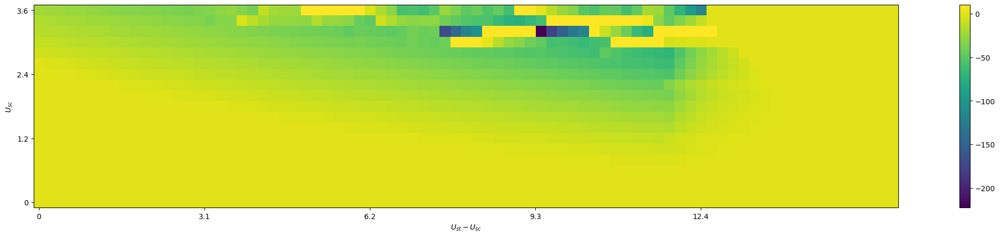

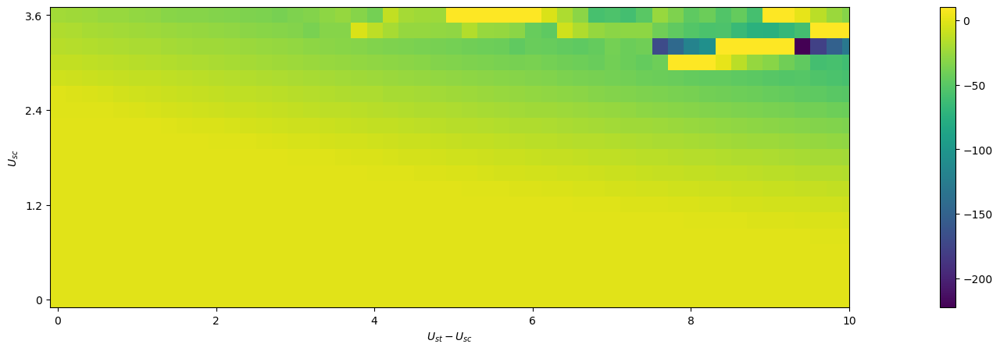

In [236]:
# print(data["w0_2"]["1000"].keys())
data_alt = {}
steps = np.linspace(0,80,81, dtype=int)
Ualt = 1600-steps*20

for sc in U_sc:
    data_alt[str(sc)] = {}
    for n in steps:
        data_alt[str(sc)][str(n*20)] = {}
        data_alt[str(sc)][str(n*20)]["scat"] = 0
        # data_alt[str(sc)][str(1160-200-n*20)]["Z"] = 
# print(data_alt["0"].keys())

l = 0
for st in data[freq].keys():
    k = 0
    for sc in data[freq][st]:
        # print(st, sc)
        # if int(st)-int(sc)>-1 and data[frequencies[0]][str(st)][str(sc)]["scat"] > 0 and data[frequencies[0]][str(st)][str(sc)]["scat"] <= 1:
        # print(st,sc)
        data_alt[str(sc)][str(int(st)-int(sc))]["scat"] = data[frequencies[0]][str(st)][str(sc)]["scat"]
            # print(st,sc,data[frequencies[0]][str(st)][str(sc)]["Z"])
            
# print(data[freq].keys())            
for sc in U_sc:
    if int(sc) < 111220:
        for st in U_st:
            if st-sc-60 > 0 and st not in [220,240,260,300,320,340]:# and st-sc-60 <1240:# and st > 360:
                upper = data_alt[str(sc)][str(st-sc)]["scat"]
                lower = data_alt[str(sc)][str(st-sc-80)]["scat"]
                diff = (lower - upper) / 4
                data_alt[str(sc)][str(st-sc-20)]["scat"] = data_alt[str(sc)][str(st-sc)]["scat"] + 1*diff / 1
                data_alt[str(sc)][str(st-sc-40)]["scat"] = data_alt[str(sc)][str(st-sc)]["scat"] + 2*diff / 1
                data_alt[str(sc)][str(st-sc-60)]["scat"] = data_alt[str(sc)][str(st-sc)]["scat"] + 3*diff / 1
                # print(data_alt[str(sc)][str(st-sc)]["Z"], data_alt[str(sc)][str(st-sc-20)]["Z"], data_alt[str(sc)][str(st-sc-40)]["Z"], data_alt[str(sc)][str(st-sc-60)]["Z"], data_alt[str(sc)][str(st-sc-80)]["Z"])

# print(data_alt.keys())
# print(data_alt["200"].keys())
data_alt_np = np.zeros( (len(data_alt.keys()), len(data_alt["200"].keys()), 3) )

for m, k1 in enumerate(data_alt.keys()):
    for n, k2 in enumerate(data_alt[k1].keys()):
        # print(k1,k2, data_alt[k1][k2]["scat"])
        data_alt_np[m,n,0] = data_alt[k1][k2]["scat"]
        data_alt_np[m,n,1] = k1
        data_alt_np[m,n,2] = k2

data_alt_np[:,:,0][data_alt_np[:,:,0]>10] = 10
# data_alt_np[:,:,0][data_alt_np[:,:,0]>1.1] = 0.0
data_alt_np_scat = data_alt_np

yticks = np.linspace(0,18,4)
yticklabels = [3.6,2.4,1.2,0]
xticks = np.linspace(0,62,5)
xticklabels = [0,3.1,6.2,9.3,12.4]

fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(30,5))
# ax.imshow((data_alt_np[:,:,0]))
pos = ax.imshow(np.flip(data_alt_np[:,:,0], axis=0))
ax.set_xticks(xticks)
ax.set_xticklabels(xticklabels)
ax.set_yticks(yticks)
ax.set_yticklabels(yticklabels)
ax.set_xlabel(r'$U_{st} - U_{sc}$')
ax.set_ylabel(r'$U_{sc}$')
fig.colorbar(pos, ax=ax)

xticks = np.linspace(0,50,6)
xticklabels = [0,2,4,6,8,10]
fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(30,5))
pos = ax.imshow(np.flip(data_alt_np[:,:,0], axis=0))
ax.set_xticks(xticks)
ax.set_xticklabels(xticklabels)
ax.set_yticks(yticks)
ax.set_yticklabels(yticklabels)
ax.set_xlabel(r'$U_{st} - U_{sc}$')
ax.set_ylabel(r'$U_{sc}$')
fig.colorbar(pos, ax=ax)
ax.set_xlim([-0.50,50.0])


In [237]:
data_alt_np[:,:,0]

array([[  0.    ,   0.    ,   0.    , ...,   0.    ,   0.    ,   0.    ],
       [  0.    ,   0.    ,   0.    , ...,   0.    ,   0.    ,   0.    ],
       [  0.    ,   0.    ,   0.    , ...,   0.    ,   0.    ,   0.    ],
       ...,
       [-15.    , -15.75  , -16.5625, ...,   0.    ,   0.    ,   0.    ],
       [-18.    , -19.    , -20.    , ...,   0.    ,   0.    ,   0.    ],
       [-22.    , -23.    , -24.25  , ...,   0.    ,   0.    ,   0.    ]])

(-0.5, 50.0)

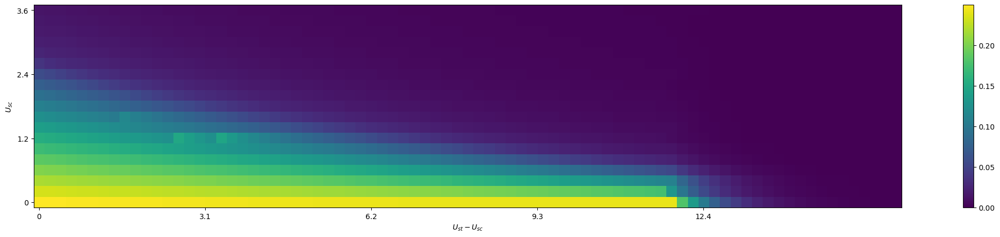

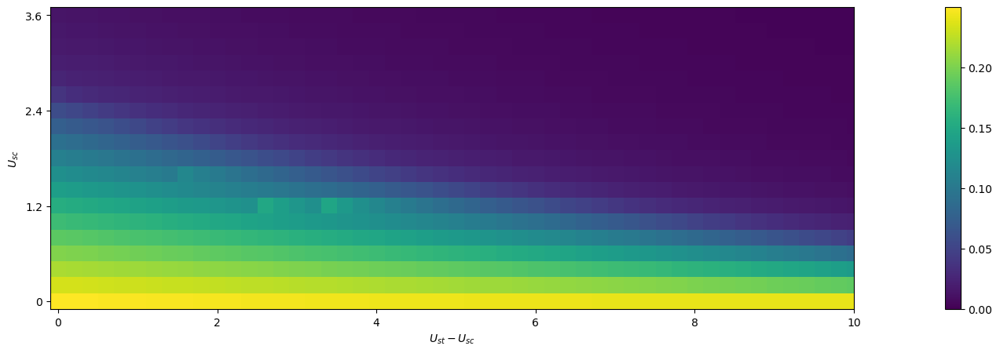

In [238]:
# print(data["w0_2"].keys())
# print(data["w0_2"]["1000"].keys())
data_alt = {}
steps = np.linspace(0,80,81, dtype=int)
Ualt = 1600-steps*20

for sc in U_sc:
    data_alt[str(sc)] = {}
    for n in steps:
        data_alt[str(sc)][str(n*20)] = {}
        data_alt[str(sc)][str(n*20)]["doubleocc"] = 0
        # data_alt[str(sc)][str(1160-200-n*20)]["doubleocc"] = 
# print(data_alt["0"].keys())

l = 0
for st in data[freq].keys():
    k = 0
    for sc in data[freq][st]:
        # print(st, sc)
        # if int(st)-int(sc)>-1 and data[frequencies[0]][str(st)][str(sc)]["doubleocc"] > 0 and data[frequencies[0]][str(st)][str(sc)]["doubleocc"] < 1:
        # print(st,sc)
        data_alt[str(sc)][str(int(st)-int(sc))]["doubleocc"] = data[frequencies[0]][str(st)][str(sc)]["doubleocc"]
            
            
for sc in U_sc:
    if int(sc) < 111220:
        for st in U_st:
            if st-sc-60 > 0 and st not in [220,240,260,300,320,340]:# and st-sc-60 <1240:# and st > 360:
                upper = data_alt[str(sc)][str(st-sc)]["doubleocc"]
                lower = data_alt[str(sc)][str(st-sc-80)]["doubleocc"]
                diff = (lower - upper) / 4
                data_alt[str(sc)][str(st-sc-20)]["doubleocc"] = data_alt[str(sc)][str(st-sc)]["doubleocc"] + 1*diff / 1
                data_alt[str(sc)][str(st-sc-40)]["doubleocc"] = data_alt[str(sc)][str(st-sc)]["doubleocc"] + 2*diff / 1
                data_alt[str(sc)][str(st-sc-60)]["doubleocc"] = data_alt[str(sc)][str(st-sc)]["doubleocc"] + 3*diff / 1
                # print(data_alt[str(sc)][str(st-sc)]["doubleocc"], data_alt[str(sc)][str(st-sc-20)]["doubleocc"], data_alt[str(sc)][str(st-sc-40)]["doubleocc"], data_alt[str(sc)][str(st-sc-60)]["doubleocc"], data_alt[str(sc)][str(st-sc-80)]["doubleocc"])

# print(data_alt.keys())
# print(data_alt["360"].keys())
data_alt_np = np.zeros( (len(data_alt.keys()), len(data_alt["200"].keys()), 3) )

for m, k1 in enumerate(data_alt.keys()):
    for n, k2 in enumerate(data_alt[k1].keys()):
        # print(k1,k2, data_alt[k1][k2]["doubleocc"])
        data_alt_np[m,n,0] = data_alt[k1][k2]["doubleocc"]
        data_alt_np[m,n,1] = k1
        data_alt_np[m,n,2] = k2

data_alt_np[:,:,0][data_alt_np[:,:,0]<0] = 0.0
data_alt_np[:,:,0][data_alt_np[:,:,0]>1] = 0.0
data_alt_np_docc = data_alt_np

yticks = np.linspace(0,18,4)
yticklabels = [3.6,2.4,1.2,0]
xticks = np.linspace(0,62,5)
xticklabels = [0,3.1,6.2,9.3,12.4]

fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(30,5))
pos = ax.imshow(np.flip(data_alt_np[:,:,0], axis=0))
ax.set_xticks(xticks)
ax.set_xticklabels(xticklabels)
ax.set_yticks(yticks)
ax.set_yticklabels(yticklabels)
ax.set_xlabel(r'$U_{st} - U_{sc}$')
ax.set_ylabel(r'$U_{sc}$')
fig.colorbar(pos, ax=ax)



xticks = np.linspace(0,50,6)
xticklabels = [0,2,4,6,8,10]
fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(30,5))
pos = ax.imshow(np.flip(data_alt_np[:,:,0], axis=0))
ax.set_xticks(xticks)
ax.set_xticklabels(xticklabels)
ax.set_yticks(yticks)
ax.set_yticklabels(yticklabels)
ax.set_xlabel(r'$U_{st} - U_{sc}$')
ax.set_ylabel(r'$U_{sc}$')
fig.colorbar(pos, ax=ax)
ax.set_xlim([-0.50,50.0])



In [239]:
print(data_alt_np_docc.shape)
print(data_alt_np_docc[0,3,1:])


(19, 81, 3)
[ 0. 60.]


2 vergleichbare Z Punkte -> verschiedene Physik -> Spektralfunktion (Satelliten vs QPPeak) -> Sigma Fortsetzung (k-aufgeloest)? -> 

w_0 = 4 !!!!

Siv wird effektiv kleiner im Sinne von 1) Bauch wird kleiner 2) Z bleibt nahezu konstant (wird kleiner?) allerdings nimmt die Scattering rate zu - i.e. das Verschwinden des Bauch drueckt nicht gleichmaessig die Kurve hinunter sondern der Endpunkt bleibt aehnlich...
 

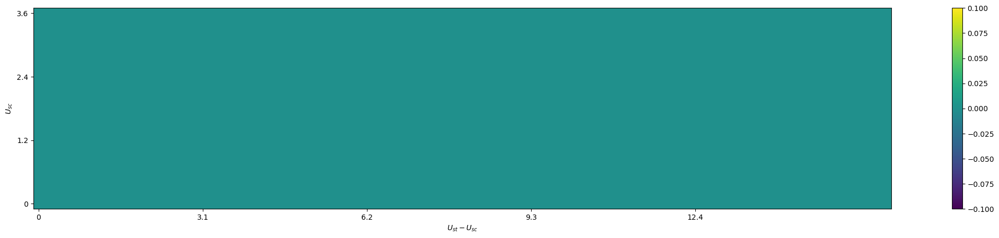

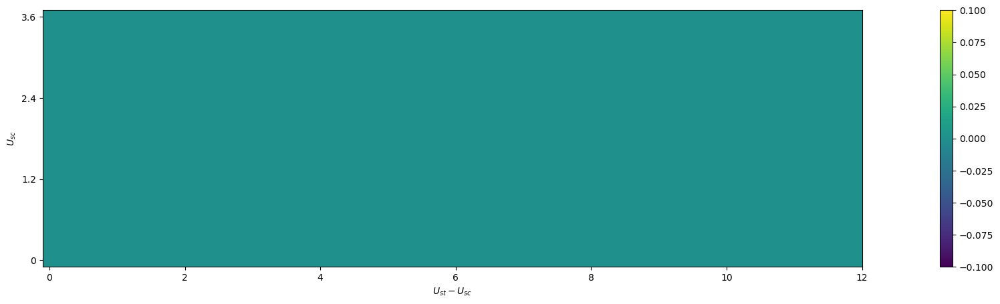

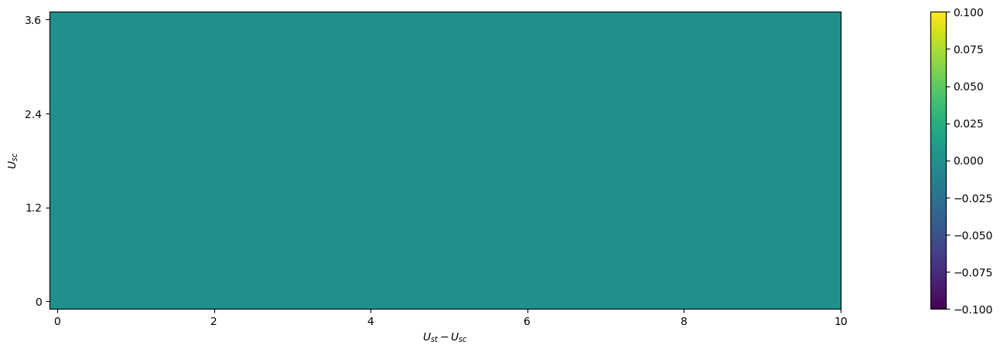

In [240]:
# print(data["w0_2"].keys())
# print(data["w0_2"]["1000"].keys())
data_alt = {}
steps = np.linspace(0,80,81, dtype=int)
Ualt = 1600-steps*20

for sc in U_sc:
    data_alt[str(sc)] = {}
    for n in steps:
        data_alt[str(sc)][str(n*20)] = {}
        data_alt[str(sc)][str(n*20)]["szsz"] = 0
        # data_alt[str(sc)][str(1160-200-n*20)]["szsz"] = 
# print(data_alt["0"].keys())

l = 0
for st in data[freq].keys():
    k = 0
    for sc in data[freq][st]:
        # print(st, sc)
        # if int(st)-int(sc)>-1 and data[frequencies[0]][str(st)][str(sc)]["szsz"] > 0 and data[frequencies[0]][str(st)][str(sc)]["szsz"] < 1:
            # print(sc,st-sc)
        data_alt[str(sc)][str(int(st)-int(sc))]["szsz"] = data[frequencies[0]][str(st)][str(sc)]["szsz"]
            
            
for sc in U_sc:
    if int(sc) < 111220:
        for st in U_st:
            if st-sc-60 > 0 and st not in [220,240,260,300,320,340]:# and st > 360:
                upper = data_alt[str(sc)][str(st-sc)]["szsz"]
                lower = data_alt[str(sc)][str(st-sc-80)]["szsz"]
                diff = (lower - upper) / 4
                data_alt[str(sc)][str(st-sc-20)]["szsz"] = data_alt[str(sc)][str(st-sc)]["szsz"] + 1*diff / 1
                data_alt[str(sc)][str(st-sc-40)]["szsz"] = data_alt[str(sc)][str(st-sc)]["szsz"] + 2*diff / 1
                data_alt[str(sc)][str(st-sc-60)]["szsz"] = data_alt[str(sc)][str(st-sc)]["szsz"] + 3*diff / 1
                # print(data_alt[str(sc)][str(st-sc)]["szsz"], data_alt[str(sc)][str(st-sc-20)]["szsz"], data_alt[str(sc)][str(st-sc-40)]["szsz"], data_alt[str(sc)][str(st-sc-60)]["szsz"], data_alt[str(sc)][str(st-sc-80)]["szsz"])

# print(data_alt.keys())
# print(data_alt["360"].keys())
data_alt_np = np.zeros( (len(data_alt.keys()), len(data_alt["200"].keys()), 3) )

for m, k1 in enumerate(data_alt.keys()):
    for n, k2 in enumerate(data_alt[k1].keys()):
        # print(k1,k2, data_alt[k1][k2]["szsz"])
        data_alt_np[m,n,0] = data_alt[k1][k2]["szsz"]
        data_alt_np[m,n,1] = k1
        data_alt_np[m,n,2] = k2

# data_alt_np[:,:,0][data_alt_np[:,:,0]<0] = 0.0
# data_alt_np[:,:,0][data_alt_np[:,:,0]>1] = 0.0
data_alt_np_szsz = data_alt_np

yticks = np.linspace(0,18,4)
yticklabels = [3.6,2.4,1.2,0]
xticks = np.linspace(0,62,5)
xticklabels = [0,3.1,6.2,9.3,12.4]

fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(30,5))
pos = ax.imshow(np.flip(data_alt_np[:,:,0], axis=0))
ax.set_xticks(xticks)
ax.set_xticklabels(xticklabels)
ax.set_yticks(yticks)
ax.set_yticklabels(yticklabels)
ax.set_xlabel(r'$U_{st} - U_{sc}$')
ax.set_ylabel(r'$U_{sc}$')
fig.colorbar(pos, ax=ax)


xticks = np.linspace(0,60,7)
xticklabels = [0,2,4,6,8,10,12]
fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(30,5))
pos = ax.imshow(np.flip(data_alt_np[:,:,0], axis=0))
ax.set_xticks(xticks)
ax.set_xticklabels(xticklabels)
ax.set_yticks(yticks)
ax.set_yticklabels(yticklabels)
ax.set_xlabel(r'$U_{st} - U_{sc}$')
ax.set_ylabel(r'$U_{sc}$')
ax.set_xlim([-0.5,60.0])
fig.colorbar(pos, ax=ax)


xticks = np.linspace(0,50,6)
xticklabels = [0,2,4,6,8,10]
fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(30,5))
pos = ax.imshow(np.flip(data_alt_np[:,:,0], axis=0))
ax.set_xticks(xticks)
ax.set_xticklabels(xticklabels)
ax.set_yticks(yticks)
ax.set_yticklabels(yticklabels)
ax.set_xlabel(r'$U_{st} - U_{sc}$')
ax.set_ylabel(r'$U_{sc}$')
ax.set_xlim([-0.50,50.0])
fig.colorbar(pos, ax=ax)




In [241]:
# # print(data["w0_2"].keys())
# # print(data["w0_2"]["1000"].keys())
# data_alt = {}
# steps = np.linspace(0,80,81, dtype=int)
# Ualt = 1600-steps*20

# for sc in U_sc:
#     data_alt[str(sc)] = {}
#     for n in steps:
#         data_alt[str(sc)][str(n*20)] = {}
#         data_alt[str(sc)][str(n*20)]["nch"] = 0
#         # data_alt[str(sc)][str(1160-200-n*20)]["nch"] = 
# # print(data_alt["0"].keys())

# l = 0
# for st in data[freq].keys():
#     k = 0
#     for sc in data[freq][st]:
#         # print(st, sc)
#         # if int(st)-int(sc)>-1 and data[frequencies[0]][str(st)][str(sc)]["nch"] > 0 and data[frequencies[0]][str(st)][str(sc)]["nch"] < 1:
#             # print(sc,st-sc)
#         data_alt[str(sc)][str(int(st)-int(sc))]["nch"] = data[frequencies[0]][str(st)][str(sc)]["nch"]
            
            
# for sc in U_sc:
#     if int(sc) < 111220:
#         for st in U_st:
#             if st-sc-60 > 0 and st not in [220,240,260,300,320,340]:# and st > 360:
#                 upper = data_alt[str(sc)][str(st-sc)]["nch"]
#                 lower = data_alt[str(sc)][str(st-sc-80)]["nch"]
#                 diff = (lower - upper) / 4
#                 data_alt[str(sc)][str(st-sc-20)]["nch"] = data_alt[str(sc)][str(st-sc)]["nch"] + 1*diff / 1
#                 data_alt[str(sc)][str(st-sc-40)]["nch"] = data_alt[str(sc)][str(st-sc)]["nch"] + 2*diff / 1
#                 data_alt[str(sc)][str(st-sc-60)]["nch"] = data_alt[str(sc)][str(st-sc)]["nch"] + 3*diff / 1
#                 # print(data_alt[str(sc)][str(st-sc)]["nch"], data_alt[str(sc)][str(st-sc-20)]["nch"], data_alt[str(sc)][str(st-sc-40)]["nch"], data_alt[str(sc)][str(st-sc-60)]["nch"], data_alt[str(sc)][str(st-sc-80)]["nch"])

# # print(data_alt.keys())
# # print(data_alt["360"].keys())
# data_alt_np = np.zeros( (len(data_alt.keys()), len(data_alt["200"].keys()), 3) )

# for m, k1 in enumerate(data_alt.keys()):
#     for n, k2 in enumerate(data_alt[k1].keys()):
#         # print(k1,k2, data_alt[k1][k2]["nch"])
#         data_alt_np[m,n,0] = data_alt[k1][k2]["nch"]
#         data_alt_np[m,n,1] = k1
#         data_alt_np[m,n,2] = k2

# # data_alt_np[:,:,0][data_alt_np[:,:,0]<0] = 0.0
# # data_alt_np[:,:,0][data_alt_np[:,:,0]>1] = 0.0

# yticks = np.linspace(0,18,4)
# yticklabels = [3.6,2.4,1.2,0]
# xticks = np.linspace(0,62,5)
# xticklabels = [0,3.1,6.2,9.3,12.4]

# fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(30,5))
# pos = ax.imshow(np.flip(data_alt_np[:,:,0], axis=0))
# ax.set_xticks(xticks)
# ax.set_xticklabels(xticklabels)
# ax.set_yticks(yticks)
# ax.set_yticklabels(yticklabels)
# ax.set_xlabel(r'$U_{st} - U_{sc}$')
# ax.set_ylabel(r'$U_{sc}$')
# fig.colorbar(pos, ax=ax)


# xticks = np.linspace(0,50,6)
# xticklabels = [0,2,4,6,8,10]
# fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(30,5))
# pos = ax.imshow(np.flip(data_alt_np[:,:,0], axis=0))
# ax.set_xticks(xticks)
# ax.set_xticklabels(xticklabels)
# ax.set_yticks(yticks)
# ax.set_yticklabels(yticklabels)
# ax.set_xlabel(r'$U_{st} - U_{sc}$')
# ax.set_ylabel(r'$U_{sc}$')
# fig.colorbar(pos, ax=ax)
# ax.set_xlim([0,50.0])



(0.0, 50.0)

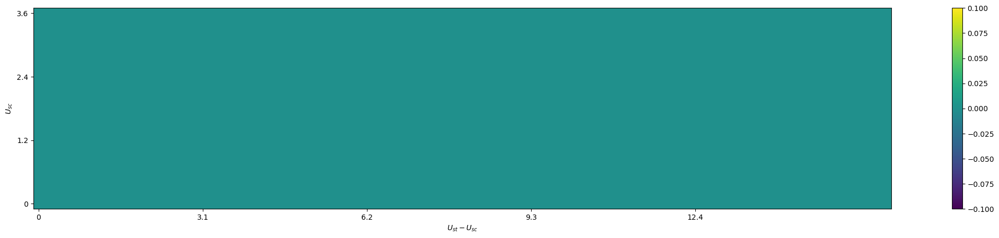

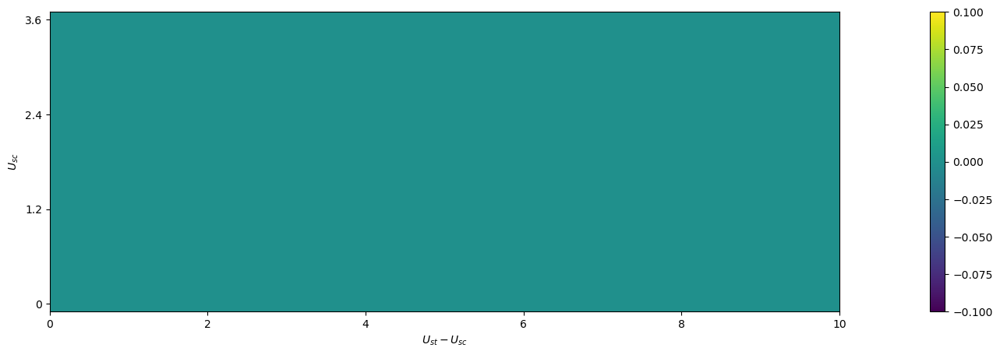

In [242]:
# print(data["w0_2"].keys())
# print(data["w0_2"]["1000"].keys())
data_alt = {}
steps = np.linspace(0,80,81, dtype=int)
Ualt = 1600-steps*20

for sc in U_sc:
    data_alt[str(sc)] = {}
    for n in steps:
        data_alt[str(sc)][str(n*20)] = {}
        data_alt[str(sc)][str(n*20)]["szszb2"] = 0
        # data_alt[str(sc)][str(1160-200-n*20)]["szszb2"] = 
# print(data_alt["0"].keys())

l = 0
for st in data[freq].keys():
    k = 0
    for sc in data[freq][st]:
        # print(st, sc)
        if int(st)-int(sc)>-1 and data[frequencies[0]][str(st)][str(sc)]["szszb2"] > 0 and data[frequencies[0]][str(st)][str(sc)]["szszb2"] <= 1:
            # print(sc,st-sc)
            data_alt[str(sc)][str(int(st)-int(sc))]["szszb2"] = data[frequencies[0]][str(st)][str(sc)]["szszb2"]
            # print(st,sc,data[frequencies[0]][str(st)][str(sc)]["szszb2"])
            
# print(data[freq].keys())            
for sc in U_sc:
    if int(sc) < 111220:
        for st in U_st:
            if st-sc-60 > 0 and st not in [220,240,260,300,320,340]:# and st > 360:
                # print(st, sc, st-sc)
                upper = data_alt[str(sc)][str(st-sc)]["szszb2"]
                lower = data_alt[str(sc)][str(st-sc-80)]["szszb2"]
                diff = (lower - upper) / 4
                data_alt[str(sc)][str(st-sc-20)]["szszb2"] = data_alt[str(sc)][str(st-sc)]["szszb2"] + 1*diff / 1
                data_alt[str(sc)][str(st-sc-40)]["szszb2"] = data_alt[str(sc)][str(st-sc)]["szszb2"] + 2*diff / 1
                data_alt[str(sc)][str(st-sc-60)]["szszb2"] = data_alt[str(sc)][str(st-sc)]["szszb2"] + 3*diff / 1
                # print(data_alt[str(sc)][str(st-sc)]["szszb2"], data_alt[str(sc)][str(st-sc-20)]["szszb2"], data_alt[str(sc)][str(st-sc-40)]["szszb2"], data_alt[str(sc)][str(st-sc-60)]["szszb2"], data_alt[str(sc)][str(st-sc-80)]["szszb2"])

# print(data_alt.keys())
# print(data_alt["200"].keys())
data_alt_np = np.zeros( (len(data_alt.keys()), len(data_alt["200"].keys()), 3) )

for m, k1 in enumerate(data_alt.keys()):
    for n, k2 in enumerate(data_alt[k1].keys()):
        # print(k1,k2, data_alt[k1][k2]["szszb2"])
        data_alt_np[m,n,0] = data_alt[k1][k2]["szszb2"]
        data_alt_np[m,n,1] = k1
        data_alt_np[m,n,2] = k2

data_alt_np[:,:,0][data_alt_np[:,:,0]<0] = 0.0
data_alt_np[:,:,0][data_alt_np[:,:,0]>1.1] = 0.0
data_alt_np_szszb2 = data_alt_np

yticks = np.linspace(0,18,4)
yticklabels = [3.6,2.4,1.2,0]
xticks = np.linspace(0,62,5)
xticklabels = [0,3.1,6.2,9.3,12.4]

fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(30,5))
# ax.imshow((data_alt_np[:,:,0]))
pos = ax.imshow(np.flip(data_alt_np[:,:,0], axis=0))
ax.set_xticks(xticks)
ax.set_xticklabels(xticklabels)
ax.set_yticks(yticks)
ax.set_yticklabels(yticklabels)
ax.set_xlabel(r'$U_{st} - U_{sc}$')
ax.set_ylabel(r'$U_{sc}$')
fig.colorbar(pos, ax=ax)


xticks = np.linspace(0,50,6)
xticklabels = [0,2,4,6,8,10]
fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(30,5))
pos = ax.imshow(np.flip(data_alt_np[:,:,0], axis=0))
ax.set_xticks(xticks)
ax.set_xticklabels(xticklabels)
ax.set_yticks(yticks)
ax.set_yticklabels(yticklabels)
ax.set_xlabel(r'$U_{st} - U_{sc}$')
ax.set_ylabel(r'$U_{sc}$')
fig.colorbar(pos, ax=ax)
ax.set_xlim([0,50.0])



In [246]:
isozete = []
isozete_idx = []
isoaim = 0.7
tol = 0.05
PATH = "saves_Z0c7_d/"

l = 0
c = [-1,-1,-1]
for v in U_sc:
    m = 100
    k = 0
    for u in U_st:
        # if np.absolute(data_np[frequencies[0]]["Z"][k,l,2]-isoaim) < tol:
        if np.absolute(data_np[frequencies[0]]["Z"][k,l,2]-isoaim) < m:
            # print(k,l, data_np[frequencies[0]]["Z"][k,l,2])
            m = np.absolute(data_np[frequencies[0]]["Z"][k,l,2]-isoaim)
            c = [u,v,data_np[frequencies[0]]["Z"][k,l,2]]
            idx = [k,l]
        k+=1
    if m < 100:
        isozete.append(c)
        isozete_idx.append(np.array(idx))
    l+=1

# Refine
isozete_ref = []
isozete_idx_ref = []
for z, idx in zip(isozete, isozete_idx):
    if abs(isoaim - z[2])<tol:
        isozete_ref.append(z)
        isozete_idx_ref.append(idx)

# Z = 0.65
if isoaim == 0.65:
    del isozete_idx[-1:]
    del isozete_ref[-1:]
# Z = 0.7
if isoaim == 0.7:
    del isozete_idx[-3:]
    del isozete_ref[-3:]


isozete_ref = np.array(isozete_ref, dtype=int)
isozete_idx_ref = np.array(isozete_idx_ref, dtype=int)
isozete_ordered = np.array([isozete_ref[:,1], isozete_ref[:,0] - isozete_ref[:,1]])

args = np.argsort(isozete_ordered[0,:])
isozete_ordered = isozete_ordered[:,args]

args = np.argsort(isozete_idx_ref[0,:])
isozete_idx_ref = isozete_idx_ref[:,args]

print(isozete_ref)


[[340   0   0]
 [360  20   0]
 [360  40   0]
 [360  60   0]
 [340  80   0]
 [300 100   0]
 [260 120   0]
 [220 140   0]]


In [ ]:
import plotly
import plotly.graph_objs as go
from IPython.display import display, HTML

## Tomas Mazak's workaround
plotly.offline.init_notebook_mode()
display(HTML(
    '<script type="text/javascript" async src="https://cdnjs.cloudflare.com/ajax/libs/mathjax/2.7.1/MathJax.js?config=TeX-MML-AM_SVG"></script>'
))
##

fig = make_subplots(horizontal_spacing = 0.08, vertical_spacing = 0.15,
    rows=2, cols=2,
    specs=[[{'type': 'contour'},{'type': 'contour'}], 
           [{'type': 'contour'},{'type': 'contour'}]],
    subplot_titles=[r"$\Large \text{Quasiparticle Renormalization} \ \ Z$", r"$\Large \text{Double Occupancy} \ \  n_\uparrow n_\downarrow$", r"$\Large \text{Spin Correlation} \ \ S_zS_z$", r"$\Large \text{Scattering Rate} \ \ \gamma$", r"$G(\tau=\beta / 2)$"]
    )

fig['layout']['xaxis']['title']=r'$\Large U_{0}$'
fig['layout']['xaxis2']['title']=r'$\Large U_{0}$'
fig['layout']['xaxis3']['title']=r'$\Large U_{0}$'
fig['layout']['xaxis4']['title']=r'$\Large U_{0}$'
# fig['layout']['xaxis5']['title']=r'$\large U_{scr}$'
fig['layout']['yaxis']['title']=r'$\Large U_{\infty} - U_{0}$'
# fig['layout']['yaxis2']['title']=r'$\Large U_{stat} - U_{scr}$'
# fig['layout']['yaxis3']['title']=r'$\Large U_{stat} - U_{scr}$'
# fig['layout']['yaxis4']['title']=r'$\Large U_{stat} - U_{scr}$'

# fig['layout']['title']=r'$\omega_0=4$'

fig['layout']['annotations'][0]['y']=1.02
fig['layout']['annotations'][1]['y']=1.02
fig['layout']['annotations'][2]['y']=0.45
fig['layout']['annotations'][3]['y']=0.45
# fig['layout']['annotations'][4]['y']=1.05

# cbarlocs = [.15, .365, .58, .79, 1.]
cbarlocs = [.468, 1.004, .468, 1.004]

trace = go.Contour(x=np.array(U_sc)/100,y=np.array(data_alt_np_Z[0,:,2])/100, z=(data_alt_np_Z[:,:,0]).transpose(), colorscale='plasma', line_smoothing=0, colorbar=dict(len=0.49, x=cbarlocs[0], y=0.79), showscale=True)
fig.append_trace(trace, 1, 1)
line = go.Scatter(
    y=isozete_ordered[1]/100,
    x=isozete_ordered[0]/100,
    mode='lines+markers',  # <- Add 'markers' here
    # mode='markers',  # <- Add 'markers' here
    line=dict(color="lightgray", width=3),
    marker=dict(
        size=14,
        symbol='circle',
        color='rgba(0,0,0,0)',  # transparent fill
        line=dict(color='black', width=4)  # black border
    ),
    showlegend=False
    # name='Identical Z-values'
)
fig.append_trace(line, 1, 1)
trace = go.Contour(x=np.array(U_sc)/100,y=np.array(data_alt_np_Z[0,:,2])/100, z=(data_alt_np_docc[:,:,0]).transpose(), colorscale='plasma', line_smoothing=0, colorbar=dict(len=0.49, x=cbarlocs[1], y=0.79), showscale=True)
fig.append_trace(trace, 1, 2)
fig.append_trace(line, 1, 2)
trace = go.Contour(x=np.array(U_sc)/100,y=np.array(data_alt_np_Z[0,:,2])/100, z=np.sqrt(4*(data_alt_np_szsz[:,:,0]).transpose()) / beta, colorscale='plasma', line_smoothing=0, colorbar=dict(len=0.49, x=cbarlocs[2], y=0.21), showscale=True)
fig.append_trace(trace, 2, 1)
fig.append_trace(line, 2, 1)
trace = go.Contour(x=np.array(U_sc)/100,y=np.array(data_alt_np_Z[0,:,2])/100, z=(data_alt_np_scat[:,:,0]).transpose(), colorscale='plasma', zmin=-1, zmax=0, 
    colorbar=dict(
        len=0.49,
        x=cbarlocs[3], 
        y=0.21,
        # title="Value",
        tickmode="array",
        tickvals=[0.5, -0.5, -1],
        ticktext=["0.5", "-0.5", "-1>"]
    ),
    line_smoothing=0, showscale=True)
fig.append_trace(trace, 2, 2)
# trace = go.Contour(x=np.array(U_sc)/100,y=np.array(data_alt_np_Z[0,:,2])/100, z=(data_alt_np_szsz[:,:,0]).transpose(), colorscale='plasma', line_smoothing=0, colorbar=dict(len=0.49, x=cbarlocs[3], y=0.22), showscale=True)
# fig.append_trace(trace, 2, 2)

# trace = go.Contour(x=np.array(U_sc)/100,y=np.array(data_alt_np_Z[0,:,2])/100, z=(data_alt_np_gtaubeta2[:,:,0]).transpose(), colorscale='plasma', line_smoothing=0, colorbar=dict(len=0.98, x=cbarlocs[4]), showscale=True)
# fig.append_trace(trace, 1, 5)
# 

fig.update_layout(
    autosize=False,
    width=1500, height=750,
    margin=dict(l=70, r=5, b=70, t=50),
)
fig.update_yaxes(range=[0, 11])
fig.update_xaxes(range=[0, 3.6])
fig.write_image(PATH+f"Quantities_Z{isoaim}_{frequencies[0]}_beta{int(beta)}.pdf", format="pdf")
fig.show()
# print(f"Quantities_ZnnSzSzgamma_{frequencies[0]}_beta{int(beta)}.pdf")



saves_Z0c65_d/spectra_U1_420_U2_0_nw2000_wmax6_niw300_noise_amplitude0.002.npz
saves_Z0c65_d/spectra_U1_440_U2_20_nw2000_wmax6_niw300_noise_amplitude0.002.npz


saves_Z0c65_d/spectra_U1_440_U2_40_nw2000_wmax6_niw300_noise_amplitude0.002.npz
saves_Z0c65_d/spectra_U1_420_U2_60_nw2000_wmax6_niw300_noise_amplitude0.002.npz
saves_Z0c65_d/spectra_U1_400_U2_80_nw2000_wmax6_niw300_noise_amplitude0.002.npz
saves_Z0c65_d/spectra_U1_380_U2_100_nw2000_wmax6_niw300_noise_amplitude0.002.npz
saves_Z0c65_d/spectra_U1_340_U2_120_nw2000_wmax6_niw300_noise_amplitude0.002.npz
saves_Z0c65_d/spectra_U1_300_U2_140_nw2000_wmax6_niw300_noise_amplitude0.002.npz
saves_Z0c65_d/spectra_U1_240_U2_160_nw2000_wmax6_niw300_noise_amplitude0.002.npz
saves_Z0c65_d/spectra_U1_200_U2_180_nw2000_wmax6_niw300_noise_amplitude0.002.npz


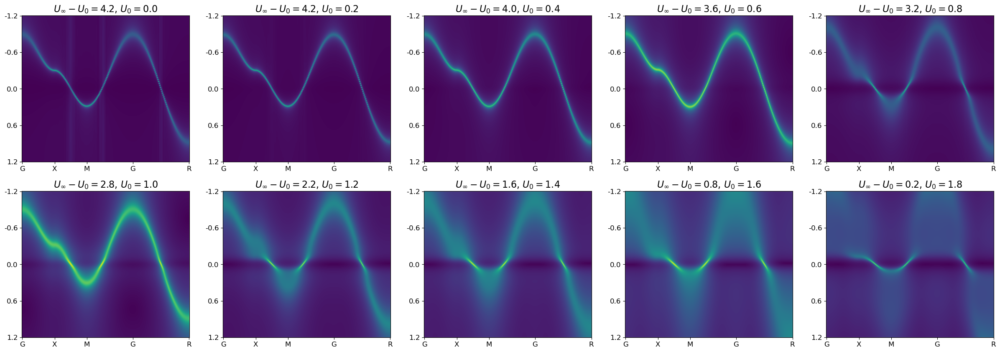

In [147]:
from matplotlib.backends.backend_pdf import PdfPages
import matplotlib as mpl
import numpy as np
from matplotlib import colors
import os.path
from pathlib import Path

ncl = 5
nrw = 2

ks = [0, 50, 100, 150, 200, 250]  # for the line plots
k_ticks  = [0, 50, 100, 171, 258]
k_labels = ["G", "X", "M", "G", "R"]
wdw = 200
lbl_step = 100
n = 0

wmax = 6
nw = 2000
wdw = 200
niw = 300

fig, ax = plt.subplots(ncols=ncl, nrows=nrw, figsize=(30,10))
c = 0
l = 0
n = 0

for n,U in enumerate (isozete_ref):#.transpose():
    # print(U)
    fname = PATH+f"spectra_U1_{isozete_ref[n,0]}_U2_{isozete_ref[n,1]}_nw{nw}_wmax{wmax}_niw{niw}_noise_amplitude0.002.npz"
    if os.path.isfile(fname):
        print(fname)
        D = np.load(fname)
        w    = D["w"]        # (nw,)
        siw = D["siws"]    # (nU, nw)
        giw  = D["giw"]     # (nU, nw, Nk)
        w0 = int(giw.shape[0]/2)+1
        w_ticks = [n*lbl_step for n in range(2*wdw // lbl_step + 1)]
        w_labels = [f"{w[800+i]:.1f}" for i in w_ticks]

        # print(w0)
        # print(w_ticks)
        # print(w_labels)
        ax[l,c].imshow((-giw[w0-wdw:w0+wdw, :].imag) / np.pi / (-np.trapz(giw[w0-wdw:w0+wdw,:].imag, x=w[w0-wdw:w0+wdw], axis=0)), 
                            aspect='auto', 
                            interpolation='bicubic', 
                            norm=colors.PowerNorm(gamma=0.4), 
                            cmap='viridis')
        # ax[l,c].imshow(-giws[n,w0-wdw:w0+wdw,:].imag / np.pi, aspect='auto', interpolation='none')
        ax[l,c].set_xticks(k_ticks)
        ax[l,c].set_xticklabels(k_labels, fontsize=12)
        ax[l,c].set_yticks(w_ticks)
        ax[l,c].set_yticklabels(w_labels, fontsize=12)
        ax[l,c].set_title(fr"$U_\infty-U_0=${(U[0]-U[1])/100}, $U_0=${U[1]/100}", fontsize=16)
        c += 1    
        if c==ncl:
            l = 1
            c = 0
fig.savefig(PATH+f"spectra_nw{nw}_wmax{wmax}_niw{niw}_noise_amplitude0.002.pdf", format="pdf", bbox_inches="tight")

In [ ]:
%%capture
import ana_cont.continuation as cont

v_max = 100
wn = np.pi/beta * (2.*np.arange(v_max) + 1.)
w = np.linspace(-20., 20., num=501, endpoint=True)
iv = data[freq][str(U_st[0])][str(U_sc[0])]["iv"][1000:1000+v_max]

noise_amplitude = 1e-3
spectra = []
givs = []
sivs = []
chitaus = []

for U in isozete_ref:#.transpose():
    print(U[0], U[1])
    giv = data[freq][str(U[0])][str(U[1])]["giv"][0,0,1000:1000+v_max]
    givs.append(giv)
    siv = data[freq][str(U[0])][str(U[1])]["siv"][0,0,1000:1000+v_max]
    sivs.append(siv)
    probl = cont.AnalyticContinuationProblem(im_axis=iv, re_axis=w,
                                            im_data=giv , kernel_mode='freq_fermionic')
    err = np.ones_like(wn)*noise_amplitude
    model = np.ones_like(w)
    model /= np.trapz(model, w)
    sol,_ = probl.solve(method='maxent_svd', alpha_determination='chi2kink', optimizer='newton', stdev=err, model=model)
    spectra.append(sol.A_opt)



/tmp/ipykernel_1044654/4168782156.py:23: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



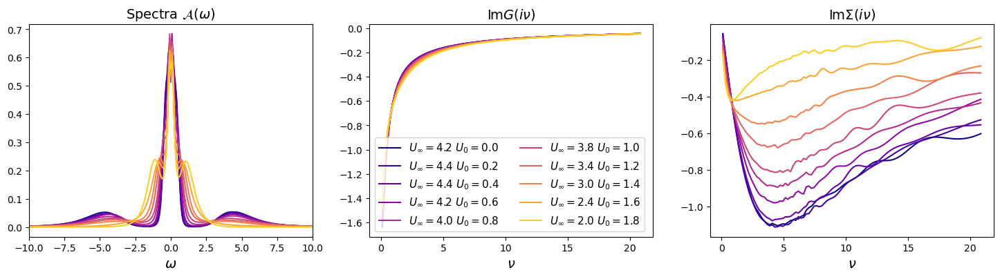

In [ ]:
from matplotlib.backends.backend_pdf import PdfPages
import matplotlib as mpl

wn = np.pi/beta * (2.*np.arange(v_max) + 1.)
w = np.linspace(-20., 20., num=501, endpoint=True)

givs = np.array(givs)
sivs = np.array(sivs)
isozete_ref = np.array(isozete_ref)
spectra = np.array(spectra)

isozete_ref = np.array(isozete_ref)
spectra = np.array(spectra)
v_max = 100
w_max = 10
iv = data[freq][str(U_st[0])][str(U_sc[0])]["iv"][1000:1000+v_max]
l = "no info"#int(frequencies[0][4:])
pos_max = []
l = [0,4,8,10]


# Get the Pastel1 colormap
cmap = mpl.cm.get_cmap('plasma')

# Extract N distinct colors
num_colors = isozete_ref.shape[0]+1
# colors = [cmap(i) for i in range(num_colors)]
colors = [cmap(i / (num_colors - 1)) for i in range(num_colors)]  # Evenly spaced in [0, 1]

# Set as global color cycle
mpl.rcParams['axes.prop_cycle'] = mpl.cycler(color=colors)

n = 0
fig, ax = plt.subplots(ncols=3, nrows=1, figsize=(18,4))
for k,s in enumerate(spectra[:]):
    # if k%2==0:
    # if k==8 or k==9:
        ax[0].plot(w, s)#, label=f"SzSz b/2= {data[freq][str(isozete_ref[n,0])][str(isozete_ref[n,1])]['szszb2']}")
        ax[0].set_xlim([-w_max,w_max])
        ax[0].set_title(r"Spectra $\mathcal{A}(\omega)$", fontsize=14)
        ax[0].set_xlabel(r"$\omega$", fontsize=14)

        ax[1].plot(iv[:v_max], givs[k,:v_max].imag, label=r"$U_{\infty}=$"+str(isozete_ref[k,0]/100)+r" $U_{0}=$"+str(isozete_ref[k,1]/100))#, label=f"Ustat = {int(isozete_ref[n,0])/100}, Uscr = {int(isozete_ref[n,1])/100}, Z = {isozete_ref[n,2]}, w = {2}, pos = {round(Decimal(w[250+np.argmax(s[250:])]),3)}")
        ax[1].set_title("Im$G(i\\nu)$", fontsize=14)
        ax[1].legend(ncol=2, fontsize=11)
        ax[1].set_xlabel(r"$\nu$", fontsize=14)

        ax[2].plot(iv[:v_max], sivs[k,:v_max].imag)#, label=f"SzSz = {data[freq][str(isozete_ref[n,0])][str(isozete_ref[n,1])]['szsz']}")
        # ax[n,2].legend()
        ax[2].set_title("Im$\Sigma(i\\nu)$", fontsize=14)
        ax[2].set_xlabel(r"$\nu$", fontsize=14)
    
pp = PdfPages(PATH+f'Equal_Z{isoaim}_spectra_{frequencies[0]}_beta{int(beta)}.pdf')
print(PATH+f'Equal_Z{isoaim}_spectra_{frequencies[0]}_beta{int(beta)}.pdf')
plt.savefig(pp, format='pdf', bbox_inches='tight')
pp.close()

/tmp/ipykernel_1044654/1183537118.py:11: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



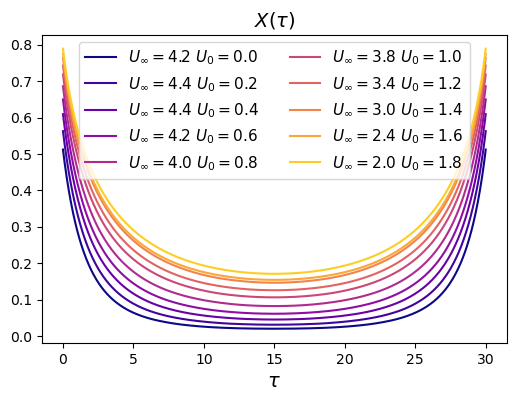

In [ ]:
# from matplotlib.backends.backend_pdf import PdfPages
# import matplotlib as mpl
# tau = np.linspace(0,beta,1001)
# chitaus = []
# for U in isozete_ref:#.transpose():
#     chitau = data[freq][str(U[0])][str(U[1])]["szsz_tau"]
#     chitaus.append(chitau)

# chitaus = np.array(chitaus)
# # Get the Pastel1 colormap
# cmap = mpl.cm.get_cmap('plasma')

# # Extract N distinct colors
# num_colors = isozete_ref.shape[0]+1
# # colors = [cmap(i) for i in range(num_colors)]
# colors = [cmap(i / (num_colors - 1)) for i in range(num_colors)]  # Evenly spaced in [0, 1]

# # Set as global color cycle
# mpl.rcParams['axes.prop_cycle'] = mpl.cycler(color=colors)

# n = 0
# fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(6,4))
# for k,s in enumerate(chitaus):

#         ax.plot(tau, s, label=r"$U_{\infty}=$"+str(isozete_ref[k,0]/100)+r" $U_{0}=$"+str(isozete_ref[k,1]/100))#, label=f"Ustat = {int(isozete_ref[n,0])/100}, Uscr = {int(isozete_ref[n,1])/100}, Z = {isozete_ref[n,2]}, w = {2}, pos = {round(Decimal(w[250+np.argmax(s[250:])]),3)}")
#         ax.set_title(r"$X(\tau)$", fontsize=14)
#         ax.legend(ncol=2, fontsize=11)
#         ax.set_xlabel(r"$\tau$", fontsize=14)
#         # ax.set_ylabel(r"$X(\tau)$", fontsize=14)

    
# # print(f'Equal_Z{isoaim}_spectra_{frequencies[0]}_beta{int(beta)}.pdf')
# pp = PdfPages(PATH+f'Chitau_Z{isoaim}_{frequencies[0]}_beta{int(beta)}.pdf')
# plt.savefig(pp, format='pdf', bbox_inches='tight')
# pp.close()

In [106]:
# from matplotlib.backends.backend_pdf import PdfPages
# import matplotlib as mpl
# import numpy as np
# from matplotlib import colors
# import os.path
# from pathlib import Path

# ncl = 4
# nrw = 2

# ks = [0, 50, 100, 150, 200, 250]  # for the line plots
# k_ticks  = [0, 50, 100, 171, 258]
# k_labels = ["G", "X", "M", "G", "R"]
# wdw = 200
# lbl_step = 100
# n = 0

# wmax = 6
# nw = 2000
# wdw = 200
# niw = 300

# fig, ax = plt.subplots(ncols=ncl, nrows=nrw, figsize=(24,10))
# c = 0
# l = 0
# n = 0

# for n,U in enumerate (isozete_ref):#.transpose():
#     fname = PATH+f"spectra_U1_{isozete_ref[n,0]}_U2_{isozete_ref[n,1]}_nw{nw}_wmax{wmax}_niw{niw}_noise_amplitude0.002.npz"
#     if os.path.isfile(fname):
#         print(fname)
#         D = np.load(fname)
#         w    = D["w"]        # (nw,)
#         siw = D["siws"]    # (nU, nw)
#         giw  = D["giw"]     # (nU, nw, Nk)
#         w0 = int(giw.shape[0]/2)+1
#         w_ticks = [n*lbl_step for n in range(2*wdw // lbl_step + 1)]
#         w_labels = [f"{w[800+i]:.1f}" for i in w_ticks]

#         # print(w0)
#         # print(w_ticks)
#         # print(w_labels)
#         ax[l,c].imshow((-giw[w0-wdw:w0+wdw, :].imag) / np.pi / (-np.trapz(giw[w0-wdw:w0+wdw,:].imag, x=w[w0-wdw:w0+wdw], axis=0)), 
#                             aspect='auto', 
#                             interpolation='bicubic', 
#                             norm=colors.PowerNorm(gamma=0.4), 
#                             cmap='viridis')
#         # # ax[l,c].imshow(-giws[n,w0-wdw:w0+wdw,:].imag / np.pi, aspect='auto', interpolation='none')
#         # ax[l,c].set_xticks(k_ticks)
#         # ax[l,c].set_xticklabels(k_labels, fontsize=12)
#         # ax[l,c].set_yticks(w_ticks)
#         # ax[l,c].set_yticklabels(w_labels, fontsize=12)
#         # ax[l,c].set_title(fr"$U_\infty-U_0=${U[0]/100}, $U_0=${U[1]/100}", fontsize=16)
#         c += 1    
#         if c==4:
#             l = 1
#             c = 0
# fig.savefig(PATH+f"spectra_nw{nw}_wmax{wmax}_niw{niw}_noise_amplitude0.002.pdf", format="pdf", bbox_inches="tight")

In [107]:
# def read_hk(PATH):

#     with open(PATH, 'r', encoding='latin1') as f:
#         lines = f.readlines()

#     Nk, Natoms, Nbands = map(int, lines[0].strip().split())

#     if Natoms != 1 or Nbands != 1:
#         raise ValueError("This parser assumes scalar Hamiltonians (Natoms = 1, Nbands = 1)")

#     kpts = []
#     hks = []

#     for i in range(Nk):
#         k_line = lines[1 + 2*i].strip()
#         h_line = lines[2 + 2*i].strip()

#         k = list(map(float, k_line.split()))
#         h_real, h_imag = map(float, h_line.split())
#         h = complex(h_real, h_imag)

#         kpts.append(k)
#         hks.append(h)

#     return np.array(kpts), np.array(hks)


# PATH = "/mnt/scratch/daniel/Data/DynamicalU_Susceptibility/PhaseSpace/Ust_vs_Usc/beta30/ham_path"
# k, hk = read_hk(PATH)
# print(hk.shape)

In [108]:
# from matplotlib.backends.backend_pdf import PdfPages
# import matplotlib as mpl
# import numpy as np
# from matplotlib import colors
# import os.path

# wmax = 10
# nw = 2000

# k_ticks  = [0, 50, 100, 171, 258]
# k_labels = ["G", "X", "M", "G", "R"]
# wdw = 600
# lbl_step = 100


# fig, ax = plt.subplots(ncols=4, nrows=2, figsize=(24,8))
# c = 0
# l = 0
# for n,U in enumerate (isozete_ref):#.transpose():
#     fname = f"saves/spectra_U1_{isozete_ref[n,0]}_U2_{isozete_ref[n,1]}_nw{nw}_wmax{wmax}.npz"
#     if os.path.isfile(fname):
#         print(fname)
#         D = np.load(fname)
#         w    = D["w"]        # (nw,)
#         siw = D["siws"]    # (nU, nw)
#         giw  = D["giw"]     # (nU, nw, Nk)
#         w0 = giw.shape[1]//2+1
#         w_ticks = [n*lbl_step for n in range(2*wdw // lbl_step + 1)]
#         w_labels = [f"{w[w0-wdw+i]:.1f}" for i in w_ticks]

#         ax[l,c].imshow((-giw[0, w0-wdw:w0+wdw, :].imag) / np.pi / (-np.trapz(giw[0,w0-wdw:w0+wdw,:].imag, x=w[w0-wdw:w0+wdw], axis=0)), 
#                             aspect='auto', 
#                             interpolation='bicubic', 
#                             norm=colors.PowerNorm(gamma=0.4), 
#                             cmap='viridis')
#         # ax[l,c].imshow(-giws[n,w0-wdw:w0+wdw,:].imag / np.pi, aspect='auto', interpolation='none')
#         ax[l,c].set_xticks(k_ticks)
#         ax[l,c].set_xticklabels(k_labels, fontsize=12)
#         ax[l,c].set_yticks(w_ticks)
#         ax[l,c].set_yticklabels(w_labels, fontsize=12)
#         ax[l,c].set_title(fr"$U_\infty-U_0=${U[0]/100}, $U_0=${U[1]/100}", fontsize=16)
#         c += 1    
#         if c==4:
#             l = 1
#             c = 0

# fig, ax = plt.subplots(ncols=4, nrows=2, figsize=(24,8))
# c = 0
# l = 0
# ks = [0,50,100,150,200,250]
# for n,U in enumerate (isozete_ref):#.transpose():
#     fname = f"saves/spectra_U1_{isozete_ref[n,0]}_U2_{isozete_ref[n,1]}_nw{nw}_wmax{wmax}.npz"
#     if os.path.isfile(fname):
#         print(fname)
#         D = np.load(fname)
#         w    = D["w"]        # (nw,)
#         siw = D["siws"]    # (nU, nw)
#         giw  = D["giw"]     # (nU, nw, Nk)
#         w0 = giw.shape[1]//2+1
#         w_ticks = [n*lbl_step for n in range(2*wdw // lbl_step + 1)]
#         w_labels = [f"{w[w0-wdw+i]:.1f}" for i in w_ticks]
#         for k in ks:
#             ax[l,c].plot(w[w0-wdw:w0+wdw], (-giw[0, w0-wdw:w0+wdw, k].imag) / np.pi / (-np.trapz(giw[0,w0-wdw:w0+wdw,k].imag, x=w[w0-wdw:w0+wdw], axis=0)))

#         c += 1    
#         if c==4:
#             l = 1
#             c = 0

# fig, ax = plt.subplots(ncols=4, nrows=2, figsize=(24,8))
# c = 0
# l = 0
# for n,U in enumerate (isozete_ref):#.transpose():
#     fname = f"saves/spectra_U1_{isozete_ref[n,0]}_U2_{isozete_ref[n,1]}_nw{nw}_wmax{wmax}.npz"
#     if os.path.isfile(fname):
#         print(fname)
#         D = np.load(fname)
#         w    = D["w"]        # (nw,)
#         siw = D["siws"]    # (nU, nw)
#         giw  = D["giw"]     # (nU, nw, Nk)
#         w0 = giw.shape[1]//2+1
#         w_ticks = [n*lbl_step for n in range(2*wdw // lbl_step + 1)]
#         w_labels = [f"{w[w0-wdw+i]:.1f}" for i in w_ticks]
#         # ax[l,c].plot(w[w0-wdw:w0+wdw], np.sum((-giw[0, w0-wdw:w0+wdw, :].imag) / np.pi / (-np.trapz(giw[0,w0-wdw:w0+wdw,:].imag, x=w[w0-wdw:w0+wdw], axis=0) ), axis=-1) / giw.shape[-1])
#         ax[l,c].plot(w[w0-wdw:w0+wdw], np.sum((-giw[0, w0-wdw:w0+wdw, :].imag) / np.pi , axis=-1) / giw.shape[-1])

#         c += 1    
#         if c==4:
#             l = 1
#             c = 0



In [112]:
# from matplotlib.backends.backend_pdf import PdfPages
# import matplotlib as mpl
# import numpy as np
# from matplotlib import colors
# import os.path
# from pathlib import Path

# PATH = "saves_Z0c7_d/"
# ncl = 4
# nrw = 2

# ks = [0, 50, 100, 150, 200, 250]  # for the line plots
# k_ticks  = [0, 50, 100, 171, 258]
# k_labels = ["G", "X", "M", "G", "R"]
# wdw = 200
# lbl_step = 100
# n = 0

# fig, ax = plt.subplots(ncols=ncl, nrows=nrw, figsize=(24,10))
# c = 0
# l = 0
# n = 0
# for p in Path(PATH).iterdir():
#     if p.is_file():
#         # print(p)
#         find = f"spectra_U1_"
#         # find = f"spectra_U1_{isozete_ref[n,0]}_U2_{isozete_ref[n,1]}"
#         if find and f"nw2000" in str(p):
#             print(p)
#             fname = p
#             D = np.load(fname)
#             w    = D["w"]        # (nw,)
#             siw = D["siws"]    # (nU, nw)
#             giw  = D["giw"]     # (nU, nw, Nk)
#             w0 = giw.shape[0]//2+1
#             w_ticks = [n*lbl_step for n in range(2*wdw // lbl_step + 1)]
#             w_labels = [f"{w[w0-wdw+i]:.1f}" for i in w_ticks]
#             print(giw.shape)
#             # ax[l,c].imshow((-giw[:, :].imag) / np.pi / (-np.trapz(giw[:,:].imag, x=w[:], axis=0)), 
#             ax[l,c].imshow((-giw[ w0-wdw:w0+wdw, :].imag) / np.pi / (-np.trapz(giw[w0-wdw:w0+wdw,:].imag, x=w[w0-wdw:w0+wdw], axis=0)), 
#                                 aspect='auto', 
#                                 interpolation='bicubic', 
#                                 norm=colors.PowerNorm(gamma=0.4), 
#                                 cmap='viridis')
#             # ax[l,c].imshow(-giws[n,w0-wdw:w0+wdw,:].imag / np.pi, aspect='auto', interpolation='none')
#             ax[l,c].set_xticks(k_ticks)
#             ax[l,c].set_xticklabels(k_labels, fontsize=12)
#             ax[l,c].set_yticks(w_ticks)
#             ax[l,c].set_yticklabels(w_labels, fontsize=12)
#             # ax[l,c].set_title(str(fname)[16:-4], fontsize=8)
#             ax[l,c].set_title(fr"$U_\infty-U_0=${isozete_ref[n,0]/100}, $U_0=${isozete_ref[n,1]/100}", fontsize=16)
#             n+=1
#             c += 1    
#             if c==4:
#                 l += 1
#                 c = 0


# fig, ax = plt.subplots(ncols=ncl, nrows=nrw, figsize=(24,16))
# c = 0
# l = 0

# for p in Path(PATH).iterdir():
#     if p.is_file():
#         # print(p)
#         find = f"spectra_U1_"
#         # find = f"spectra_U1_{isozete_ref[n,0]}_U2_{isozete_ref[n,1]}"
#         if find and f"nw2000" in str(p):
#             fname = p
#             D = np.load(fname)
#             w    = D["w"]        # (nw,)
#             siw = D["siws"]    # (nU, nw)
#             giw  = D["giw"]     # (nU, nw, Nk)
#             w0 = giw.shape[1]//2+1
#             # w_ticks = [n*lbl_step for n in range(2*wdw // lbl_step + 1)]
#             # w_labels = [f"{w[w0-wdw+i]:.1f}" for i in w_ticks]
#             for k in ks:
#                 # ax[l,c].plot(w[w0-wdw:w0+wdw], (-giw[0, w0-wdw:w0+wdw, k].imag) / np.pi / (-np.trapz(giw[0,w0-wdw:w0+wdw,k].imag, x=w[w0-wdw:w0+wdw], axis=0)))
#                 ax[l,c].plot(w[:], (-giw[ :, k].imag) / np.pi / (-np.trapz(giw[:,k].imag, x=w[:], axis=0)))

#             c += 1    
#             if c==4:
#                 l += 1
#                 c = 0

# fig, ax = plt.subplots(ncols=ncl, nrows=nrw, figsize=(24,16))
# c = 0
# l = 0

# for p in Path(PATH).iterdir():
#     if p.is_file():
#         # print(p)
#         find = f"spectra_U1_"
#         # find = f"spectra_U1_{isozete_ref[n,0]}_U2_{isozete_ref[n,1]}"
#         if find and f"nw2000" in str(p):
#             fname = p
#             D = np.load(fname)
#             w    = D["w"]        # (nw,)
#             siw = D["siws"]    # (nU, nw)
#             giw  = D["giw"]     # (nU, nw, Nk)
#             w0 = giw.shape[1]//2+1
#             # w_ticks = [n*lbl_step for n in range(2*wdw // lbl_step + 1)]
#             # w_labels = [f"{w[w0-wdw+i]:.1f}" for i in w_ticks]
#             # ax[l,c].plot(w[w0-wdw:w0+wdw], np.sum((-giw[0, w0-wdw:w0+wdw, :].imag) / np.pi / (-np.trapz(giw[0,w0-wdw:w0+wdw,:].imag, x=w[w0-wdw:w0+wdw], axis=0) ), axis=-1) / giw.shape[-1])
#             # ax[l,c].plot(w[w0-wdw:w0+wdw], np.sum((-giw[0, w0-wdw:w0+wdw, :].imag) / np.pi , axis=-1) / giw.shape[-1])
#             ax[l,c].plot(w[:], np.sum((-giw[ :, :].imag) / np.pi , axis=-1) / giw.shape[-1])
#             # ax[l,c].set_title(str(fname)[16:-4], fontsize=8)
#             c += 1    
#             if c==4:
#                 l += 1
#                 c = 0

# fig, ax = plt.subplots(ncols=ncl, nrows=nrw, figsize=(24,16))
# c = 0
# l = 0

# for p in Path(PATH).iterdir():
#     if p.is_file():
#         # print(p)
#         find = f"spectra_U1_"
#         # find = f"spectra_U1_{isozete_ref[n,0]}_U2_{isozete_ref[n,1]}"
#         if find and f"nw2000" in str(p):
#             fname = p
#             D = np.load(fname)
#             w    = D["w"]        # (nw,)
#             siw = D["siws"]    # (nU, nw)
#             giw  = D["giw"]     # (nU, nw, Nk)
#             w0 = giw.shape[1]//2+1
#             # w_ticks = [n*lbl_step for n in range(2*wdw // lbl_step + 1)]
#             # w_labels = [f"{w[w0-wdw+i]:.1f}" for i in w_ticks]
#             # ax[l,c].plot(w[w0-wdw:w0+wdw], np.sum((-giw[0, w0-wdw:w0+wdw, :].imag) / np.pi / (-np.trapz(giw[0,w0-wdw:w0+wdw,:].imag, x=w[w0-wdw:w0+wdw], axis=0) ), axis=-1) / giw.shape[-1])
#             # ax[l,c].plot(w[w0-wdw:w0+wdw], np.sum((-giw[0, w0-wdw:w0+wdw, :].imag) / np.pi , axis=-1) / giw.shape[-1])
#             ax[l,c].plot((siw[:].imag))
#             # ax[l,c].set_title(str(fname)[16:-4], fontsize=8)
#             # c += 1    
#             # if c==4:
#             #     l += 1
#             #     c = 0



In [111]:
# import os
# import re
# import glob
# import math
# import numpy as np
# import matplotlib.pyplot as plt
# from matplotlib import colors

# # --- config (kept from your script) ---
# wmax   = 10
# nw     = 2000
# k_ticks  = [0, 50, 100, 171, 258]
# k_labels = ["G", "X", "M", "G", "R"]
# wdw      = 200
# lbl_step = 100
# ks_lines = [0, 50, 100, 150, 200, 250]  # for the line plots
# # --------------------------------------

# # find and sort all matching files; extract U1, U2 from filename
# pat = re.compile(r"^spectra_U1_([-+]?\d+(?:\.\d+)?)_U2_([-+]?\d+(?:\.\d+)?)_")
# files = []
# for path in glob.glob(os.path.join("saves_1", "spectra_U1_*_U2_*_*.npz")):
#     m = pat.match(os.path.basename(path))
#     if m:
#         U1 = float(m.group(1))
#         U2 = float(m.group(2))
#         files.append((U1, U2, path))
# files.sort(key=lambda x: (x[0], x[1]))
# if not files:
#     raise SystemExit("No matching files in saves/")

# # figure grid
# n = len(files)
# ncols = 4
# nrows = math.ceil(n / ncols)
# figsize = (6 * ncols, 4 * nrows)

# # --- Figure 1: imshow of normalized A(k, w) window ---
# fig1, ax1 = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize)
# ax1 = np.atleast_2d(ax1)
# for idx, (U1, U2, path) in enumerate(files):
#     r, c = divmod(idx, ncols)
#     D = np.load(path)
#     w   = D["w"]         # (nw,)
#     giw = D["giw"]       # (nU, nw, Nk), complex
#     w0 = giw.shape[1] // 2 + 1
#     w_slice = slice(w0 - wdw, w0 + wdw)

#     # y-axis ticks/labels
#     w_ticks  = [n * lbl_step for n in range(2 * wdw // lbl_step + 1)]
#     w_labels = [f"{w[w0 - wdw + i]:.1f}" for i in w_ticks]

#     # A(k,w) and per-k normalization over the plotted window
#     A = (-giw[0, w_slice, :].imag) / np.pi                     # (2*wdw, Nk)
#     denom = -np.trapz(giw[0, w_slice, :].imag, x=w[w_slice], axis=0)  # (Nk,)
#     A_norm = A / denom

#     ax = ax1[r, c]
#     im = ax.imshow(
#         A_norm,
#         aspect="auto",
#         interpolation="bicubic",
#         norm=colors.PowerNorm(gamma=0.4),
#         cmap="viridis",
#     )
#     ax.set_xticks(k_ticks)
#     ax.set_xticklabels(k_labels, fontsize=12)
#     ax.set_yticks(w_ticks)
#     ax.set_yticklabels(w_labels, fontsize=12)
#     ax.set_title(fr"$U_\infty-U_0={U1/100:.2f},\ U_0={U2/100:.2f}$", fontsize=16)

# # --- Figure 2: selected k-cuts ---
# fig2, ax2 = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize)
# ax2 = np.atleast_2d(ax2)
# for idx, (U1, U2, path) in enumerate(files):
#     r, c = divmod(idx, ncols)
#     D = np.load(path)
#     w   = D["w"]
#     giw = D["giw"]
#     w0 = giw.shape[1] // 2 + 1
#     w_slice = slice(w0 - wdw, w0 + wdw)
#     Nk = giw.shape[-1]
#     ks = [k for k in ks_lines if k < Nk]  # guard against small Nk

#     ax = ax2[r, c]
#     for k in ks:
#         num = (-giw[0, w_slice, k].imag) / np.pi
#         den = -np.trapz(giw[0, w_slice, k].imag, x=w[w_slice], axis=0)
#         ax.plot(w[w_slice], num / den, lw=1.0)
#     ax.set_title(fr"$U_\infty-U_0={U1/100:.2f},\ U_0={U2/100:.2f}$", fontsize=16)

# # --- Figure 3: k-averaged spectrum over the window (as in your last block) ---
# fig3, ax3 = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize)
# ax3 = np.atleast_2d(ax3)
# for idx, (U1, U2, path) in enumerate(files):
#     r, c = divmod(idx, ncols)
#     D = np.load(path)
#     w   = D["w"]
#     giw = D["giw"]
#     w0 = giw.shape[1] // 2 + 1
#     w_slice = slice(w0 - wdw, w0 + wdw)

#     A_plain = (-giw[0, w_slice, :].imag) / np.pi  # (2*wdw, Nk)
#     y = np.mean(A_plain, axis=-1)                 # average over k
#     ax3[r, c].plot(w[w_slice], y, lw=1.0)
#     ax3[r, c].set_title(fr"$U_\infty-U_0={U1/100:.2f},\ U_0={U2/100:.2f}$", fontsize=16)

# for f in (fig1, fig2, fig3):
#     f.tight_layout()
# plt.show()


In [14]:
# # szsz = np.array(np.sum ( f['dmft-last']['ineq-001']['ntau-n0']['value'][0,0,0,0,:] + f['dmft-last']['ineq-001']['ntau-n0']['value'][0,1,0,1,:] - f['dmft-last']['ineq-001']['ntau-n0']['value'][0,0,0,1,:] - f['dmft-last']['ineq-001']['ntau-n0']['value'][0,1,0,0,:] )*beta/1000 )

# print(np.array(U_sc).shape)
# np.array(U_sc)[isozete_idx_ref[0]]

# import plotly.graph_objects as go
# import numpy as np

# # 1. Create a grid for the surface (example: z = X * Y / 10)
# x = np.linspace(0, 10, 50)
# y = np.linspace(0, 10, 50)
# X, Y = np.meshgrid(x, y)
# Z = (X * Y) / 10  # just an illustrative surface

# # 2. Define the specific points you want to highlight.
# #    For each point, supply its (x, y, z) coordinates.
# #    Here is an example list of three points:
# points_x = np.array([2, 5, 8])
# points_y = np.array([3, 4, 6])
# points_z = (points_x * points_y) / 10  # evaluate z on the same function for consistency

# # 3. Build the figure with one Surface trace and one Scatter3d trace.
# fig = go.Figure(
#     data=[
#         # Surface trace
#         go.Surface(
#             x=np.array(U_sc)/100,
#             y=np.array(data_alt_np_Z[0,:,2])/100, 
#             z=np.sqrt((data_alt_np_szsz[:,:,0]).transpose()) / beta,
#             colorscale="Viridis",
#             showscale=True,
#             opacity=0.8,
#             name="Surface"
#         ),
#         # Scatter3d trace for highlighted points
#         go.Scatter3d(
#             x=np.array(U_sc)[isozete_idx_ref[0]]/100,
#             y=np.array(data_alt_np_Z[0,isozete_idx_ref[1],2])/100, 
#             z=np.sqrt((data_alt_np_szsz[isozete_idx_ref[0],isozete_idx_ref[1],0]).transpose()) / beta,
#             mode="markers",
#             marker=dict(
#                 size=6,
#                 color="red",
#                 symbol="circle"
#             ),
#             name="Highlighted Points"
#         )
#     ]
# )

# fig.update_yaxes(range=[0, 11])
# # fig.update_xaxes(range=[0, 3.6])

# # 4. Adjust the layout (optional tweaks for clarity)
# fig.update_layout(
#     scene=dict(
#         xaxis_title="X",
#         yaxis_title="Y",
#         zaxis_title="Z"
#     ),
#     margin=dict(l=0, r=0, b=0, t=0)
# )

# fig.show()


### Analytic continuation of Self-Energy

In [ ]:
# # %%capture
# import ana_cont.continuation as cont

# niw = 1000    # number of Matsubara frequencies
# iw_max = niw
# wn = np.pi/beta * (2.*np.arange(iw_max) + 1.)
# iv = data[freq][str(U_st[0])][str(U_sc[0])]["iv"][1000:1000+iw_max]
# nw =  4000   # number of real frequencies
# wmax =  100

# w = np.linspace(-wmax, wmax, num=nw, endpoint=True)
# # n_points_half = int(nw/2)          # points on one side (excluding zero)
# # shift = 1e-1                 # controls clustering near zero
# # pos = np.logspace(np.log10(shift), np.log10(wmax + shift), n_points_half) - shift
# # w = np.concatenate((-pos[::-1], pos))
# # print(w)
# # x = pp1

# noise_amplitude = 5e-3
# err = np.ones_like(wn)*noise_amplitude

# siv_spectra = []
# sivs = []
# siws = []
# giw = []

# for n,U in enumerate(isozete_ref):#.transpose():
#     if n>0:
#         print(U)
#         siw = data[freq][str(U[0])][str(U[1])]["siv"][0,0,1000:]
#         mu = data[freq][str(U[0])][str(U[1])]["mu"]
#         Z = data[freq][str(U[0])][str(U[1])]["Z"]

#         # define the problem
#         model = np.ones_like(w)  # flat default model
#         model /= np.trapz(model, w)  # normalization, not strictly necessary

#         # the problem is defined by: imaginary grid, real grid, data, kernel type
#         probl = cont.AnalyticContinuationProblem(im_axis=wn,  # imaginary grid
#                                                 re_axis=w,  # real grid
#                                                 im_data=1j * siw.imag[:niw],  # data
#                                                 kernel_mode='freq_fermionic')  # kernel type
        
#         # most basic way to solve the problem
#         sol, _ = probl.solve(method='maxent_svd',  # Maxent solver that works with singular value decomp.
#                             optimizer='newton',  # newton root finding for the optimization problem
#                             alpha_determination='chi2kink',
#                             model=model,  # default model
#                             stdev=err[:niw],  # standard deviation of the data
#                             alpha_start=1e12,  # largest alpha, starting value
#                             interactive=False)
        
#         sol,_ = probl.solve(method='maxent_svd', alpha_determination='chi2kink', optimizer='newton', stdev=err, model=model)
#         sw = cont.GreensFunction(spectrum=sol.A_opt, wgrid=w, kind='fermionic').kkt() + mu[0,0]
#         siv_spectra.append(sol.A_opt)
#         sivs.append(siw)
#         siws.append(sw)
#         giw.append(1 / (w[:,None] - hk[None,:] + mu[0,0] - sw[:,None]))

#         break




[360  20   0]
4000 data points on real axis
2000 data points on imaginary axis
67 significant singular values
Precomputation of coefficient matrices...


In [ ]:
# print(isozete_ref[0,0], isozete_ref[0,1])
# w = np.asarray(w, dtype=np.float64)           # (nw,)
# siws_arr = np.stack(siws, axis=0)             # (nU, nw)
# giw_arr  = np.stack(giw,  axis=0)             # (nU, nw, Nk)  complex

# np.savez_compressed(f"saves/spectra_U1{isozete_ref[0,0]}_U2{isozete_ref[0,1]}.npz", w=w, siws=siws_arr, giw=giw_arr)

280 0


saves/spectra_U1_300_U2_60_nw2000_wmax10.npz
1001


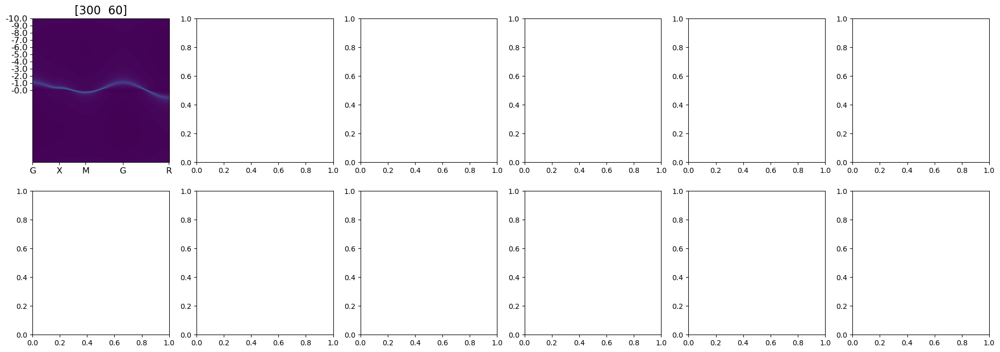

In [ ]:
from matplotlib import colors
import os.path

giws = np.array(giw)
siws = np.array(siw)

k_ticks  = [0, 50, 100, 171, 258]
k_labels = ["G", "X", "M", "G", "R"]
w_ticks  = [0, 100, 200, 300, 400, 500, 600, 700, 800, 900, 999]
# w_labels = [w[0], w[1000], w[2000], w[3000], w[3999]]

wmax = 10
nw = 2000
wdw = 99

fig, ax = plt.subplots(ncols=6, nrows=2, figsize=(24,8))
c = 0
l = 0
for n,U in enumerate (isozete_ref):#.transpose():
    fname = f"saves/spectra_U1_{isozete_ref[n,0]}_U2_{isozete_ref[n,1]}_nw{nw}_wmax{wmax}.npz"
    if os.path.isfile(fname):
        print(fname)
        D = np.load(fname)
        w    = D["w"]        # (nw,)
        siw = D["siws"]    # (nU, nw)
        giw  = D["giw"]     # (nU, nw, Nk)
        w0 = int(giw.shape[1]/2)+1
        print(w0)
        w_labels = [f"{w[i]:.1f}" for i in w_ticks]

        # print(w_labels)
        # ax[l,c].imshow((-giw[0, w0-wdw:w0+wdw, :].imag) / np.pi / (-np.trapz(giw[0,w0-wdw:w0+wdw,:].imag, x=w[w0-wdw:w0+wdw], axis=0)), 
        ax[l,c].imshow((-giw[0, :, :].imag) / np.pi / (-np.trapz(giw[0,:,:].imag, x=w[:], axis=0)), 
                            aspect='auto', 
                            interpolation='bicubic', 
                            norm=colors.PowerNorm(gamma=0.6), 
                            cmap='viridis')
        # ax[l,c].imshow(-giws[n,w0-wdw:w0+wdw,:].imag / np.pi, aspect='auto', interpolation='none')
        ax[l,c].set_xticks(k_ticks)
        ax[l,c].set_xticklabels(k_labels, fontsize=12)
        ax[l,c].set_yticks(w_ticks)
        ax[l,c].set_yticklabels(w_labels, fontsize=12)
        ax[l,c].set_title(U[:2], fontsize=16)
        c += 1    
        if c==6:
            l = 1
            c = 0



In [1]:
from matplotlib import colors
import os.path

# giws = np.array(giw)
# siws = np.array(siw)

k_ticks  = [0, 50, 100, 171, 258]
k_labels = ["G", "X", "M", "G", "R"]
w_ticks  = [0,100,200,300,399]

wmax = 10
nw = 2000
wdw = 200

fig, ax = plt.subplots(ncols=5, nrows=2, figsize=(24,8))
c = 0
l = 0
for n,U in enumerate (isozete_ref):#.transpose():
    fname = f"/mnt/scratch/daniel/Data/DynamicalU_Susceptibility/PhaseSpace/Ust_vs_Usc/beta30/saves_Z0c75/spectra_U1_{isozete_ref[n,0]}_U2_{isozete_ref[n,1]}_nw{nw}_wmax{wmax}.npz"
    print(fname)
    if os.path.isfile(fname):
        print(fname)
        D = np.load(fname)
        w    = D["w"]        # (nw,)
        siw = D["siws"]    # (nU, nw)
        giw  = D["giw"]     # (nU, nw, Nk)
        w0 = int(giw.shape[1]/2)+1
        w_labels = [f"{w[800+i]:.1f}" for i in w_ticks]

        # print(w0)
        # print(w_ticks)
        # print(w_labels)
        ax[l,c].imshow((-giw[0, w0-wdw:w0+wdw, :].imag) / np.pi / (-np.trapz(giw[0,w0-wdw:w0+wdw,:].imag, x=w[w0-wdw:w0+wdw], axis=0)), 
                            aspect='auto', 
                            interpolation='bicubic', 
                            norm=colors.PowerNorm(gamma=0.4), 
                            cmap='viridis')
        # ax[l,c].imshow(-giws[n,w0-wdw:w0+wdw,:].imag / np.pi, aspect='auto', interpolation='none')
        ax[l,c].set_xticks(k_ticks)
        ax[l,c].set_xticklabels(k_labels, fontsize=12)
        ax[l,c].set_yticks(w_ticks)
        ax[l,c].set_yticklabels(w_labels, fontsize=12)
        ax[l,c].set_title(fr"$U_\infty-U_0=${U[0]/100}, $U_0=${U[1]/100}", fontsize=16)
        c += 1    
        if c==5:
            l = 1
            c = 0



NameError: name 'plt' is not defined

In [ ]:
# %%capture
import ana_cont.continuation as cont

nw =  2000   # number of real frequencies
wmax =  150
w = np.linspace(-wmax, wmax, num=nw, endpoint=True)

siv_spectra = []
sivs = []
siws = []
giw = []

niw = [700]    
iw_max = [700]
noise_amplitude = [1e-2]


for n,U in enumerate(isozete_ref):
    print(U)

    wn = np.pi/beta * (2.*np.arange(iw_max[n]) + 1.)
    iv = data[freq][str(U_st[0])][str(U_sc[0])]["iv"][1000:1000+iw_max[n]]
    err = np.ones_like(wn[n])*noise_amplitude

    siw = data[freq][str(U[0])][str(U[1])]["siv"][0,0,1000:]
    mu = data[freq][str(U[0])][str(U[1])]["mu"]
    Z = data[freq][str(U[0])][str(U[1])]["Z"]

    # define the problem
    model = np.ones_like(w)  # flat default model
    model /= np.trapz(model, w)  # normalization, not strictly necessary

    # the problem is defined by: imaginary grid, real grid, data, kernel type
    probl = cont.AnalyticContinuationProblem(im_axis=wn,  # imaginary grid
                                            re_axis=w,  # real grid
                                            im_data=1j * siw.imag[:niw],  # data
                                            kernel_mode='freq_fermionic')  # kernel type
    
    # most basic way to solve the problem
    sol, _ = probl.solve(method='maxent_svd',  # Maxent solver that works with singular value decomp.
                        optimizer='newton',  # newton root finding for the optimization problem
                        alpha_determination='chi2kink',
                        model=model,  # default model
                        stdev=err[:niw],  # standard deviation of the data
                        alpha_start=1e12,  # largest alpha, starting value
                        interactive=True)
    
    sol,_ = probl.solve(method='maxent_svd', alpha_determination='chi2kink', optimizer='newton', stdev=err, model=model)
    sw = cont.GreensFunction(spectrum=sol.A_opt, wgrid=w, kind='fermionic').kkt() + mu[0,0]
    siv_spectra.append(sol.A_opt)
    sivs.append(siw)
    siws.append(sw)
    giw.append(1 / (w[:,None] - hk[None,:] + mu[0,0] - sw[:,None]))

    break


In [ ]:
fig = make_subplots(
    rows=1, cols=1,
    specs=[[{'type': 'surface'}]],
    subplot_titles=[])

n = 0

fig.add_trace(
go.Surface(z=-giws[n,w0-wdw:w0+wdw,:].imag / np.pi / (-np.sum(giws[n,w0-wdw:w0+wdw,:].imag / np.pi, axis=0)), colorscale='viridis', showscale=False),
row=1, col=1)


fig.update_scenes(xaxis_title_text='U_static',  
                  yaxis_title_text='U_screen')


camera = dict(
    eye=dict(x=-0.5, y=-2.5, z=1.)
)
aspectratio = dict(x=1, y=1, z=1.5)
# camera_position()


fig.update_layout(
    title=r'$\beta=20, \omega_0=4.0$',
    autosize=True,
    width=900, height=800,
    margin=dict(l=10, r=5, b=0, t=35),
    scene1 = dict(
        zaxis_title_text ="A(k,w)",
    ),
#     scene = dict(zaxis = dict(range=[-1,1],),),
)

# fig.write_html("/home/fs72150/springerd/Projects/DynamicalU/w4c0_beta20.html")


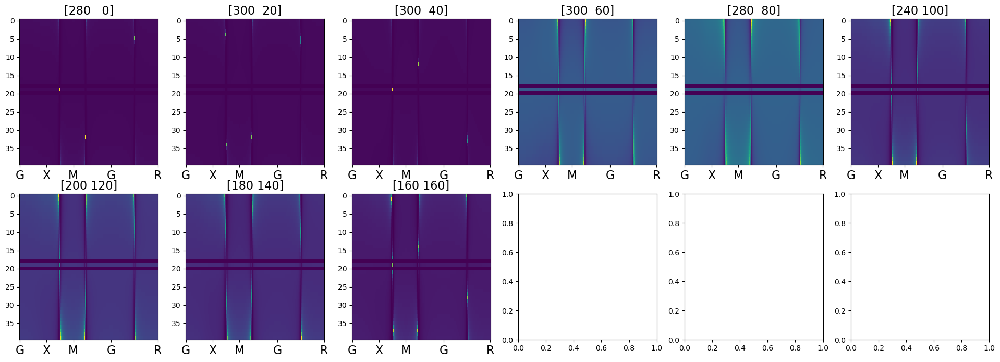

In [23]:
giws = np.array(giw)
siws = np.array(siws)

w0 = int(giws.shape[1]/2)+1
wdw = 20

k_ticks  = [0, 50, 100, 171, 258]
k_labels = ["G", "X", "M", "G", "R"]

fig, ax = plt.subplots(ncols=6, nrows=2, figsize=(24,8))
c = 0
l = 0
for n,U in enumerate (isozete_ref):#.transpose():

    ax[l,c].imshow(-giws[n,w0-wdw:w0+wdw,:].imag / np.pi / (-np.sum(giws[n,w0-wdw:w0+wdw,:].imag / np.pi, axis=0)), aspect='auto', interpolation='none')
    # ax[l,c].imshow(-giws[n,w0-wdw:w0+wdw,:].imag / np.pi, aspect='auto', interpolation='none')
    ax[l,c].set_xticks(k_ticks)
    ax[l,c].set_xticklabels(k_labels, fontsize=16)
    ax[l,c].set_title(U[:2], fontsize=16)
    c += 1    
    if c==6:
        l = 1
        c = 0


(9, 1001)


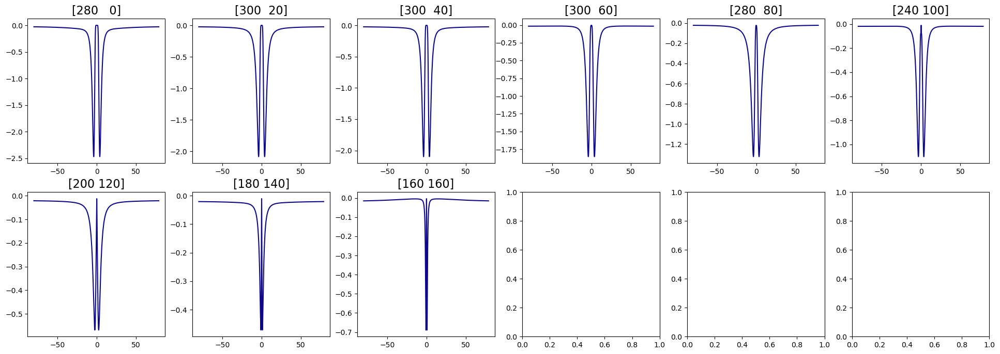

In [33]:
giws = np.array(giw)
siws = np.array(siws)

w0 = int(giws.shape[1]/2)+1
wdw = 20

s = 0
e = -1

fig, ax = plt.subplots(ncols=6, nrows=2, figsize=(24,8))
c = 0
l = 0
for n,U in enumerate (isozete_ref):#.transpose():
    
    ax[l,c].plot(w[s:e],siws[n][s:e].imag)
    ax[l,c].set_title(U[:2], fontsize=16)
    c += 1    
    if c==6:
        l = 1
        c = 0
print(siws.shape)

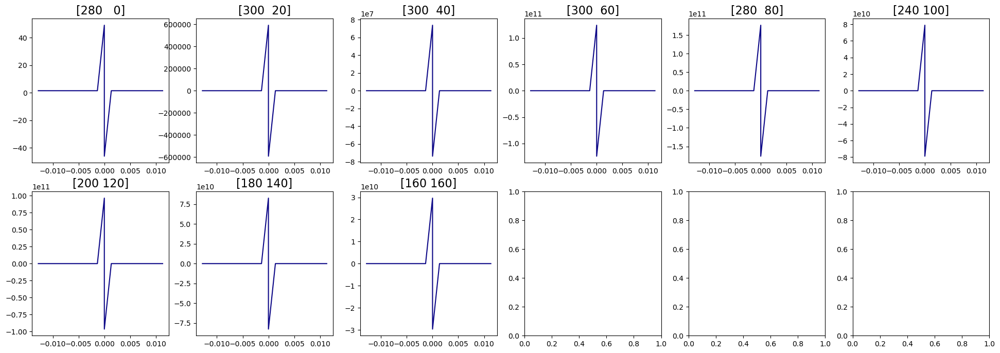

In [30]:
giws = np.array(giw)
siws = np.array(siws)

w0 = int(giws.shape[1]/2)+1
wdw = 20

s = 490
e = 510

fig, ax = plt.subplots(ncols=6, nrows=2, figsize=(24,8))
c = 0
l = 0
for n,U in enumerate (isozete_ref):#.transpose():
    
    ax[l,c].plot(w[s:e],siws[n][s:e].real)
    ax[l,c].set_title(U[:2], fontsize=16)
    c += 1    
    if c==6:
        l = 1
        c = 0


501 data points on real axis
200 data points on imaginary axis
49 significant singular values
Precomputation of coefficient matrices...
log10(alpha) = 12.00,	chi2 = 1.817e+08,   S = -2.889e-11,   nfev = 1,   norm = 1.000
log10(alpha) = 11.00,	chi2 = 1.817e+08,   S = -2.889e-09,   nfev = 7,   norm = 1.000
log10(alpha) = 10.00,	chi2 = 1.817e+08,   S = -2.891e-07,   nfev = 11,   norm = 1.001
log10(alpha) = 9.00,	chi2 = 1.816e+08,   S = -2.916e-05,   nfev = 14,   norm = 1.006
log10(alpha) = 8.00,	chi2 = 1.805e+08,   S = -3.170e-03,   nfev = 17,   norm = 1.058
log10(alpha) = 7.00,	chi2 = 1.595e+08,   S = -6.498e-01,   nfev = 20,   norm = 1.911
log10(alpha) = 6.00,	chi2 = 2.626e+07,   S = -2.524e+01,   nfev = 31,   norm = 11.371
log10(alpha) = 5.00,	chi2 = 8.401e+05,   S = -5.315e+01,   nfev = 24,   norm = 19.542
log10(alpha) = 4.00,	chi2 = 1.495e+05,   S = -5.983e+01,   nfev = 20,   norm = 20.832
log10(alpha) = 3.00,	chi2 = 1.335e+05,   S = -6.190e+01,   nfev = 21,   norm = 20.333
log10(alp

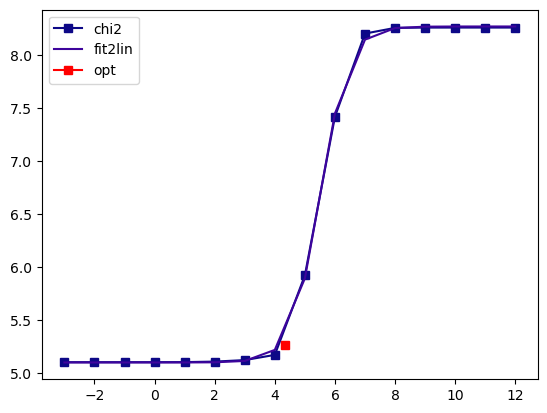

501 data points on real axis
200 data points on imaginary axis
49 significant singular values
Precomputation of coefficient matrices...
log10(alpha) = 9.00,	chi2 = 1.816e+08,   S = -2.916e-05,   nfev = 11,   norm = 1.006
log10(alpha) = 8.00,	chi2 = 1.805e+08,   S = -3.170e-03,   nfev = 17,   norm = 1.058
log10(alpha) = 7.00,	chi2 = 1.595e+08,   S = -6.498e-01,   nfev = 20,   norm = 1.911
log10(alpha) = 6.00,	chi2 = 2.626e+07,   S = -2.524e+01,   nfev = 31,   norm = 11.371
log10(alpha) = 5.00,	chi2 = 8.401e+05,   S = -5.315e+01,   nfev = 24,   norm = 19.542
log10(alpha) = 4.00,	chi2 = 1.495e+05,   S = -5.983e+01,   nfev = 20,   norm = 20.832
log10(alpha) = 3.00,	chi2 = 1.335e+05,   S = -6.190e+01,   nfev = 21,   norm = 20.333
log10(alpha) = 2.00,	chi2 = 1.292e+05,   S = -6.895e+01,   nfev = 71,   norm = 19.913
log10(alpha) = 1.00,	chi2 = 1.278e+05,   S = -8.958e+01,   nfev = 52,   norm = 19.838
log10(alpha) = 0.00,	chi2 = 1.276e+05,   S = -1.124e+02,   nfev = 34,   norm = 19.830
log10(a

In [ ]:
siw = data[freq][str(U1)][str(U2)]["siv"][0,0,1000:]
mu = data[freq][str(U1)][str(U2)]["mu"]

# define the problem
niw = 100  # number of Matsubara frequencies
wn = np.pi / beta * (2. * np.arange(niw) + 1.)  # fermionic Matsubara frequencies

w = np.linspace(-30., 30., num=501, endpoint=True)  # real-frequency grid
model = np.ones_like(w)  # flat default model
model /= np.trapz(model, w)  # normalization, not strictly necessary

# the problem is defined by: imaginary grid, real grid, data, kernel type
probl = cont.AnalyticContinuationProblem(im_axis=wn,  # imaginary grid
                                        re_axis=w,  # real grid
                                        im_data=1j * siw.imag[:niw],  # data
                                        kernel_mode='freq_fermionic')  # kernel type

# most basic way to solve the problem
sol, _ = probl.solve(method='maxent_svd',  # Maxent solver that works with singular value decomp.
                    optimizer='newton',  # newton root finding for the optimization problem
                    alpha_determination='chi2kink',
                    model=model,  # default model
                    stdev=err[:niw],  # standard deviation of the data
                    alpha_start=1e12,  # largest alpha, starting value
                    interactive=True)

sol,_ = probl.solve(method='maxent_svd', alpha_determination='chi2kink', optimizer='newton', stdev=err, model=model)
sw = cont.GreensFunction(spectrum=sol.A_opt, wgrid=w, kind='fermionic').kkt() + mu[0,0]
siv_spectra.append(sol.A_opt)
sivs.append(siw)
siws.append(sw)
giw.append(1 / (w[:,None] - hk[None,:] + mu[0,0] - sw[:,None]))

12

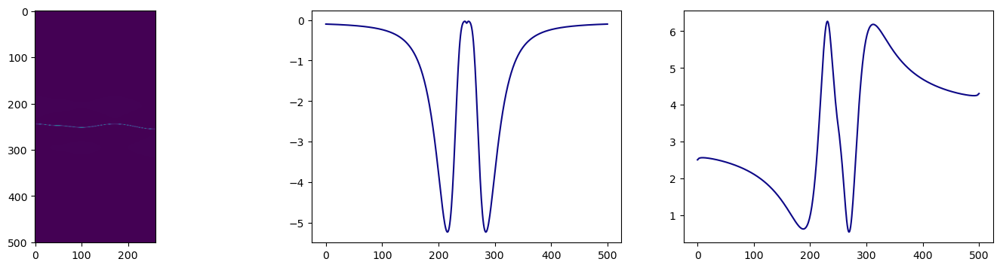

In [ ]:
fig, ax = plt.subplots(ncols=3, nrows=1, figsize=(18,4))

ax[0].imshow(-giw[11].imag / np.pi)
ax[1].plot(siws[11].imag)
ax[2].plot(siws[11].real)

len(giw)

In [ ]:
# %%capture
# import ana_cont.continuation as cont

# # define the problem
# niw = 100  # number of Matsubara frequencies
# wn = np.pi / beta * (2. * np.arange(niw) + 1.)  # fermionic Matsubara frequencies
# noise_amplitude = 1e-3
# err = np.ones_like(wn)*noise_amplitude

# w = np.linspace(-20., 20., num=501, endpoint=True)  # real-frequency grid
# spectra_siv = []
# Sigma_ret = []

# for U in isozete_ref:#.transpose():
#     print(U[0], U[1])
#     giv = data[freq][str(U[0])][str(U[1])]["giv"][0,0,1000:1000+v_max]
#     givs.append(giv)
#     siv = data[freq][str(U[0])][str(U[1])]["siv"][0,0,1000:1000+v_max]
#     sivs.append(siv)
#     model = np.ones_like(w)  # flat default model
#     model /= np.trapz(model, w)  # normalization, not strictly necessary

#     # the problem is defined by: imaginary grid, real grid, data, kernel type
#     probl = cont.AnalyticContinuationProblem(im_axis = wn,  # imaginary grid
#                                             re_axis  = w,  # real grid
#                                             im_data  = 1j * siv.imag[:niw],  # data
#                                             kernel_mode='freq_fermionic')  # kernel type

#     # most basic way to solve the problem
#     sol, _ = probl.solve(method='maxent_svd',  # Maxent solver that works with singular value decomp.
#                         optimizer='newton',  # newton root finding for the optimization problem
#                         alpha_determination='chi2kink',
#                         model=model,  # default model
#                         stdev=err[:niw],  # standard deviation of the data
#                         alpha_start=1e12,  # largest alpha, starting value
#                         interactive=True)
#     spectra_siv.append(sol.A_opt)
#     Sigma_ret.append(cont.GreensFunction(
#                         spectrum=sol.A_opt,
#                         wgrid   = w,
#                         kind    = 'fermionic'
#                         ).kkt() + mu) 

# spectra_siv = np.array(spectra_siv)
# Sigma_ret = np.array(Sigma_ret)

In [ ]:
# print(sol.A_opt.shape)
# # cont.GreensFunction(
# #                         spectrum=sol.A_opt,
# #                         wgrid   = w,
# #                         kind    = 'fermionic'
# #                         ).kkt() + mu

(501,)


In [ ]:
mu = []
for U in isozete_ref:#.transpose():
    mu.append(data[freq][str(U[0])][str(U[1])]["mu"])
mu = np.array(mu)
print(w.shape)
print(spectra_siv.shape)
print(mu.shape)
print(hk.shape)
print(w.shape)

G = np.zeros((w.shape[0], hk.shape[0]))

G[:,:] = 1 / (w[:,None] - hk[None,:] + mu[0,0,0] - spectra_siv[0,:,None])
# G = 1/(w[:,None] + mu)


(501,)
(11, 501)
(11, 1, 2)
(259,)
(501,)


/tmp/ipykernel_926580/430308638.py:13: ComplexWarning:

Casting complex values to real discards the imaginary part



In [ ]:
print(G)

[[-0.06068742 -0.06068399 -0.06067373 ... -0.05180328 -0.05179586
  -0.05179338]
 [-0.06098136 -0.0609779  -0.06096753 ... -0.0520173  -0.05200982
  -0.05200732]
 [-0.06127813 -0.06127463 -0.06126417 ... -0.05223308 -0.05222554
  -0.05222302]
 ...
 [ 0.04280645  0.04280816  0.04281327 ...  0.04869724  0.0487038
   0.04870599]
 [ 0.0426593   0.042661    0.04266607 ...  0.04850689  0.0485134
   0.04851557]
 [ 0.04251317  0.04251486  0.0425199  ...  0.04831804  0.0483245
   0.04832666]]


(1000,)


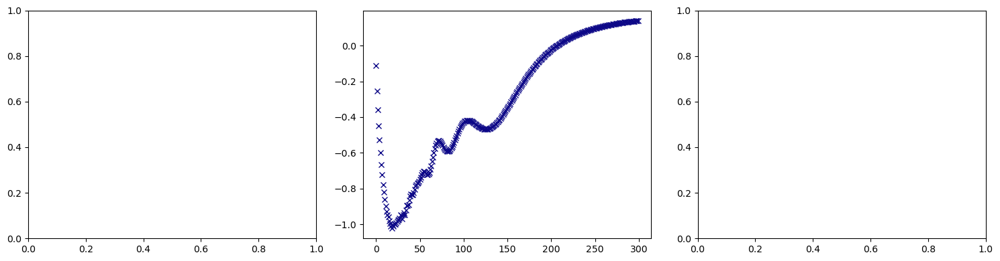

In [ ]:
print(sivs[0].shape)
#plot results
fig, ax = plt.subplots(ncols=3, nrows=1, figsize=(15, 4))
# ax[0].plot(w, spectra_siv[0,:], label='Maxent solution')
# ax[0].legend()
# ax[0].set_xlim(-10., 10.)
# ax[0].set_xlabel(r'$\omega$')
# # ax[1].plot(w, spectra_siv[0,:].imag, label='Maxent solution')
# # ax[1].legend()
# # ax[1].set_xlim(-10., 10.)
# # ax[1].set_xlabel(r'$\omega$')
# ax[2].plot(w, G[:,0].real, label='Maxent solution')
# ax[2].legend()
# ax[2].set_xlim(-10., 10.)
# ax[2].set_xlabel(r'$\omega$')
ax[1].plot(sivs[4][:300].imag, marker='x', ls='None')
# ax[1].plot(wn, sol.backtransform.imag)
# ax[1].set_xlabel(r'$i\omega_n$')
# ax[2].plot(wn, (sivs[4,:][:niw] - sol.backtransform).imag)
# ax[2].plot(wn, err[:niw], ls='--', color='gray')
# ax[2].plot(wn, -err[:niw], ls='--', color='gray')
# ax[2].set_xlabel(r'$i\omega_n$')
plt.tight_layout()
plt.show()

In [ ]:
# import plotly
# import plotly.graph_objs as go
# from IPython.display import display, HTML

# ## Tomas Mazak's workaround
# plotly.offline.init_notebook_mode()
# display(HTML(
#     '<script type="text/javascript" async src="https://cdnjs.cloudflare.com/ajax/libs/mathjax/2.7.1/MathJax.js?config=TeX-MML-AM_SVG"></script>'
# ))
# ##

# fig = make_subplots(horizontal_spacing = 0.06,
#     rows=1, cols=5,
#     specs=[[{'type': 'contour'},{'type': 'contour'},{'type': 'contour'},{'type': 'contour'},{'type': 'contour'}]],# [{'type': 'contour'},{'type': 'contour'},{'type': 'contour'},{'type': 'contour'}]],
#     subplot_titles=[r'$\Large Z$', r"$\Large n_\uparrow n_\downarrow$", r"$\Large S_zS_z$", r"Scatt", r"$G(\tau=\beta / 2)$"]
#     )

# # fig['layout']['xaxis']['title']=r'$\large U_{stat} - U_{scr}$'
# # fig['layout']['xaxis2']['title']=r'$\large U_{stat} - U_{scr}$'
# # fig['layout']['xaxis3']['title']=r'$\large U_{stat} - U_{scr}$'
# # fig['layout']['xaxis4']['title']=r'$\large U_{stat} - U_{scr}$'
# # fig['layout']['yaxis']['title']=r'$\large U_{scr}$'

# fig['layout']['xaxis']['title']=r'$\large U_{scr}$'
# fig['layout']['xaxis2']['title']=r'$\large U_{scr}$'
# fig['layout']['xaxis3']['title']=r'$\large U_{scr}$'
# fig['layout']['xaxis4']['title']=r'$\large U_{scr}$'
# fig['layout']['xaxis5']['title']=r'$\large U_{scr}$'
# fig['layout']['yaxis']['title']=r'$\large U_{stat} - U_{scr}$'
# # fig['layout']['yaxis2']['title']=r'$\large U_{stat}$'
# # fig['layout']['yaxis3']['title']=r'$\large U_{stat}$'
# # fig['layout']['yaxis4']['title']=r'$\large U_{stat}$'

# # fig['layout']['title']=r'$\omega_0=4$'

# fig['layout']['annotations'][0]['y']=1.05
# fig['layout']['annotations'][1]['y']=1.05
# fig['layout']['annotations'][2]['y']=1.05
# fig['layout']['annotations'][3]['y']=1.05
# fig['layout']['annotations'][4]['y']=1.05

# cbarlocs = [.15, .365, .58, .79, 1.]

# trace = go.Contour(x=np.array(U_sc)/100,y=np.array(data_alt_np_Z[0,:,2])/100, z=(data_alt_np_Z[:,:,0]).transpose(), colorscale='plasma', line_smoothing=0, colorbar=dict(len=0.98, x=cbarlocs[0]), showscale=True)
# line = go.Scatter(
#     y=isozete_ordered[1]/100,
#     x=isozete_ordered[0]/100,
#     mode='lines+markers',  # <- Add 'markers' here
#     # mode='markers',  # <- Add 'markers' here
#     line=dict(color='#12f202', width=0.8),
#     marker=dict(size=6, color='white'),  # Optional: customize dot size/color
#     name='Identical Z-values'
# )
# fig.append_trace(trace, 1, 1)
# fig.append_trace(line, 1, 1)
# trace = go.Contour(x=np.array(U_sc)/100,y=np.array(data_alt_np_Z[0,:,2])/100, z=(data_alt_np_docc[:,:,0]).transpose(), colorscale='plasma', line_smoothing=0, colorbar=dict(len=0.98, x=cbarlocs[1]), showscale=True)
# fig.append_trace(trace, 1, 2)
# trace = go.Contour(x=np.array(U_sc)/100,y=np.array(data_alt_np_Z[0,:,2])/100, z=(data_alt_np_szsz[:,:,0]).transpose(), colorscale='plasma', line_smoothing=0, colorbar=dict(len=0.98, x=cbarlocs[2]), showscale=True)
# fig.append_trace(trace, 1, 3)
# # trace = go.Contour(x=np.array(U_sc)/100,y=np.array(data_alt_np_Z[0,:,2])/100, z=(data_alt_np_scat[:,:,0]).transpose(), colorscale='viridis', line_smoothing=0, colorbar=dict(len=0.98, x=cbarlocs[3]), showscale=True)
# trace = go.Contour(x=np.array(U_sc)/100,y=np.array(data_alt_np_Z[0,:,2])/100, z=(data_alt_np_szszb2[:,:,0]).transpose(), colorscale='plasma', line_smoothing=0, colorbar=dict(len=0.98, x=cbarlocs[3]), showscale=True)
# fig.append_trace(trace, 1, 4)
# trace = go.Contour(x=np.array(U_sc)/100,y=np.array(data_alt_np_Z[0,:,2])/100, z=(data_alt_np_gtaubeta2[:,:,0]).transpose(), colorscale='plasma', line_smoothing=0, colorbar=dict(len=0.98, x=cbarlocs[4]), showscale=True)
# fig.append_trace(trace, 1, 5)
# # 
# # colorbar=dict(len=0.98, x=cbarlocs[4]), 
# # fig.add_trace(
# #     go.Contour(x=np.array(U_sc)/100,y=np.array(data_alt_np_Z[0,:,2])/100, z=(data_alt_np_Z[:,:,0]).transpose(), colorscale='viridis', line_smoothing=0, showscale=True),
# # row=1, col=1)

# # fig.add_trace(
# #     go.Contour(x=np.array(U_sc)/100,y=np.array(data_alt_np_Z[0,:,2])/100, z=(data_alt_np_docc[:,:,0]).transpose(), colorscale='viridis', line_smoothing=0, showscale=True),
# # row=1, col=2)

# # fig.add_trace(
# #     go.Contour(x=np.array(U_sc)/100,y=np.array(data_alt_np_Z[0,:,2])/100, z=(data_alt_np_szsz[:,:,0]).transpose(), colorscale='viridis', line_smoothing=0, showscale=True),
# # row=1, col=3)

# # fig.add_trace(
# #     go.Contour(x=np.array(U_sc)/100,y=np.array(data_alt_np_Z[0,:,2])/100, z=(data_alt_np_scat[:,:,0]).transpose(), colorscale='viridis', line_smoothing=0, showscale=True),
# # row=1, col=4)

# fig.update_layout(
#     autosize=False,
#     width=2000, height=500,
#     margin=dict(l=70, r=5, b=70, t=50),
# )
# fig.update_yaxes(range=[0, 11])
# fig.update_xaxes(range=[0, 3.6])
# # fig.write_image(f"Quantities_ZnnSzSzgamma_at_w0{frequencies[0]}.pdf")

# # print(data_alt_np_Z[0,:,0])

In [ ]:
# from matplotlib.backends.backend_pdf import PdfPages
# import matplotlib as mpl

# givs = np.array(givs)
# sivs = np.array(sivs)
# isozete_ref = np.array(isozete_ref)
# spectra = np.array(spectra)

# sivs = np.array(sivs)
# givs = np.array(givs)
# isozete_ref = np.array(isozete_ref)
# spectra = np.array(spectra)
# v_max = 20
# w_max = 10
# l = "no info"#int(frequencies[0][4:])
# pos_max = []
# l = [0,4,8,10]

# print(spectra.shape)


# # Get the Pastel1 colormap
# cmap = mpl.cm.get_cmap('plasma')

# # Extract N distinct colors
# num_colors = 20
# colors = [cmap(i) for i in range(num_colors)]

# # Set as global color cycle
# mpl.rcParams['axes.prop_cycle'] = mpl.cycler(color=colors)

# n = 0
# fig, ax = plt.subplots(ncols=3, nrows=spectra.shape[0], figsize=(18,spectra.shape[0]*4))
# for k,s in enumerate(spectra[:]):
#     # fig, ax = plt.subplots(ncols=3, nrows=1, figsize=(18,4))
#     # print(isozete_ref[n])
#     ax[n,0].plot(w, s, label=r"$U_{stat}=$"+str(isozete_ordered[1,k]/100)+r" $U_{sc}=$"+str(isozete_ordered[0,k]/100))#, label=f"SzSz b/2= {data[freq][str(isozete_ref[n,0])][str(isozete_ref[n,1])]['szszb2']}")
#     ax[n,0].set_xlim([-w_max,w_max])
#     ax[n,0].legend()
#     # ax[n,0].legend()
#     # title = freq[:2] + "=" + freq[3:]
#     # ax[0].set_title(title)
#     # ax[0].set_ylim([0, 1])

#     # if (isozete_ref[n,0] - isozete_ref[n,1]) > 0:
#     #     w0 = round(2 * l / (isozete_ref[n,0] - isozete_ref[n,1]), 2)
#     # else:
#     #     w0 = -1
#     # print(np.argmax(s[250:])) 
#     ax[n,1].plot(iv[:v_max], givs[k,:v_max].imag)#, label=f"Ustat = {int(isozete_ref[n,0])/100}, Uscr = {int(isozete_ref[n,1])/100}, Z = {isozete_ref[n,2]}, w = {2}, pos = {round(Decimal(w[250+np.argmax(s[250:])]),3)}")
#     ax[n,1].set_title("Im$G(i\\nu)$")
#     # ax[n,1].legend()
#     # print(str(isozete_ref[n,0]),str(isozete_ref[n,1]))
#     ax[n,2].plot(iv[:v_max], sivs[k,:v_max].imag)#, label=f"SzSz = {data[freq][str(isozete_ref[n,0])][str(isozete_ref[n,1])]['szsz']}")
#     # ax[n,2].legend()
#     ax[n,2].set_title("Im$\Sigma(i\\nu)$")
    
# # print(f'{frequencies[0]}_spectra_Z{isoaim}.pdf')
# pp = PdfPages(f'{frequencies[0]}_spectra_Z{isoaim}.pdf')
# plt.savefig(pp, format='pdf')
# pp.close()

In [ ]:
data_alt_np_scat[:,:,0][data_alt_np_scat[:,:,0]<-10] = -10
data_alt_np_scat[:,:,0][data_alt_np_scat[:,:,0]>0] = 0
# print(np.max(data_alt_np_scat[:,:,0]))


/tmp/ipykernel_441618/2807675867.py:4: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



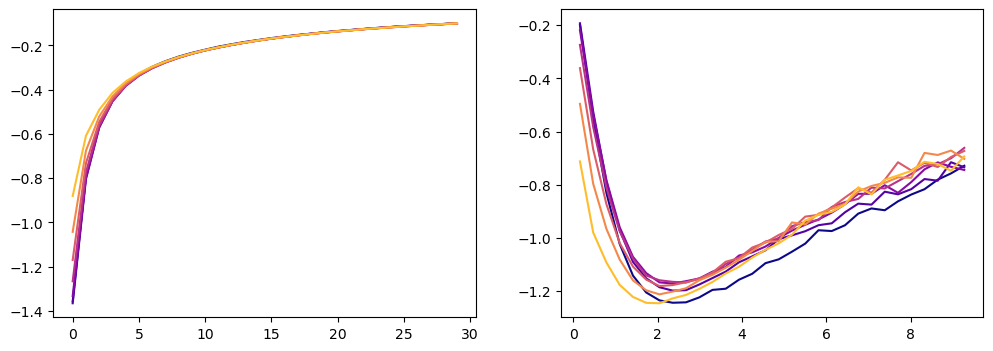

In [ ]:
ust = "440"
iv = data[freq][ust]["0"]["iv"]

cmap = mpl.cm.get_cmap('plasma')
num_colors = 8
colors = [cmap(i / (num_colors - 1)) for i in range(num_colors)]  # Evenly spaced in [0, 1]
mpl.rcParams['axes.prop_cycle'] = mpl.cycler(color=colors)

fig, ax = plt.subplots(ncols=2, figsize=(12,4))
ax[0].plot(data[freq][ust]["0"]["giv"][0,0,1000:1030].imag)
ax[0].plot(data[freq][ust]["20"]["giv"][0,0,1000:1030].imag)
ax[0].plot(data[freq][ust]["40"]["giv"][0,0,1000:1030].imag)
ax[0].plot(data[freq][ust]["60"]["giv"][0,0,1000:1030].imag)
ax[0].plot(data[freq][ust]["80"]["giv"][0,0,1000:1030].imag)
ax[0].plot(data[freq][ust]["100"]["giv"][0,0,1000:1030].imag)
ax[0].plot(data[freq][ust]["120"]["giv"][0,0,1000:1030].imag)

ax[1].plot(iv[1000:1030], data[freq][ust]["0"]["siv"][0,0,1000:1030].imag)
ax[1].plot(iv[1000:1030], data[freq][ust]["20"]["siv"][0,0,1000:1030].imag)
ax[1].plot(iv[1000:1030], data[freq][ust]["40"]["siv"][0,0,1000:1030].imag)
ax[1].plot(iv[1000:1030], data[freq][ust]["60"]["siv"][0,0,1000:1030].imag)
ax[1].plot(iv[1000:1030], data[freq][ust]["80"]["siv"][0,0,1000:1030].imag)
ax[1].plot(iv[1000:1030], data[freq][ust]["100"]["siv"][0,0,1000:1030].imag)
ax[1].plot(iv[1000:1030], data[freq][ust]["120"]["siv"][0,0,1000:1030].imag)

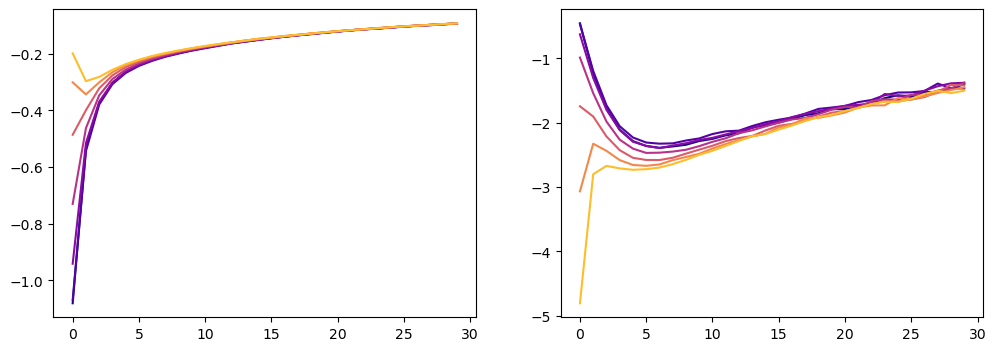

In [ ]:
fig, ax = plt.subplots(ncols=2, figsize=(12,4))
ax[0].plot(data[freq]["680"]["0"]["giv"][0,0,1000:1030].imag)
ax[0].plot(data[freq]["680"]["20"]["giv"][0,0,1000:1030].imag)
ax[0].plot(data[freq]["680"]["40"]["giv"][0,0,1000:1030].imag)
ax[0].plot(data[freq]["680"]["60"]["giv"][0,0,1000:1030].imag)
ax[0].plot(data[freq]["680"]["80"]["giv"][0,0,1000:1030].imag)
ax[0].plot(data[freq]["680"]["100"]["giv"][0,0,1000:1030].imag)
ax[0].plot(data[freq]["680"]["120"]["giv"][0,0,1000:1030].imag)

ax[1].plot(data[freq]["680"]["0"]["siv"][0,0,1000:1030].imag)
ax[1].plot(data[freq]["680"]["20"]["siv"][0,0,1000:1030].imag)
ax[1].plot(data[freq]["680"]["40"]["siv"][0,0,1000:1030].imag)
ax[1].plot(data[freq]["680"]["60"]["siv"][0,0,1000:1030].imag)
ax[1].plot(data[freq]["680"]["80"]["siv"][0,0,1000:1030].imag)
ax[1].plot(data[freq]["680"]["100"]["siv"][0,0,1000:1030].imag)
ax[1].plot(data[freq]["680"]["120"]["siv"][0,0,1000:1030].imag)

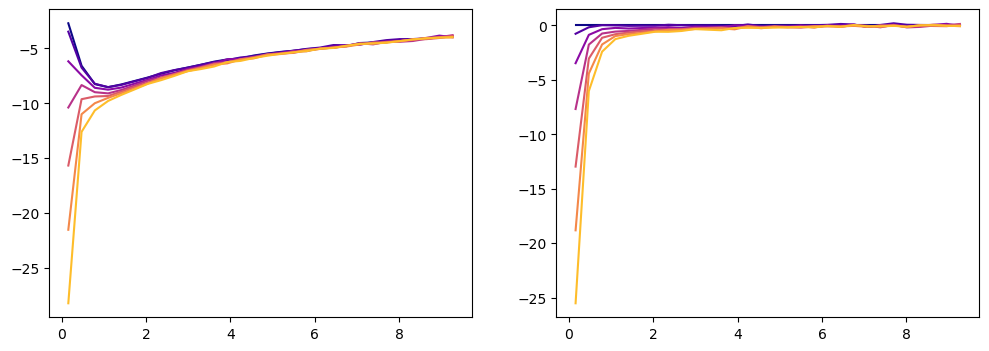

In [ ]:
fig, ax = plt.subplots(ncols=2, figsize=(12,4))
ax[0].plot(iv[1000:1030], data[freq]["1240"]["0"]["siv"][0,0,1000:1030].imag)
ax[0].plot(iv[1000:1030], data[freq]["1240"]["20"]["siv"][0,0,1000:1030].imag)
ax[0].plot(iv[1000:1030], data[freq]["1240"]["40"]["siv"][0,0,1000:1030].imag)
ax[0].plot(iv[1000:1030], data[freq]["1240"]["60"]["siv"][0,0,1000:1030].imag)
ax[0].plot(iv[1000:1030], data[freq]["1240"]["80"]["siv"][0,0,1000:1030].imag)
ax[0].plot(iv[1000:1030], data[freq]["1240"]["100"]["siv"][0,0,1000:1030].imag)
ax[0].plot(iv[1000:1030], data[freq]["1240"]["120"]["siv"][0,0,1000:1030].imag)

ax[1].plot(iv[1000:1030], data[freq]["1240"]["0"]["siv"][0,0,1000:1030].imag - data[freq]["1240"]["0"]["siv"][0,0,1000:1030].imag)
ax[1].plot(iv[1000:1030], data[freq]["1240"]["20"]["siv"][0,0,1000:1030].imag - data[freq]["1240"]["0"]["siv"][0,0,1000:1030].imag)
ax[1].plot(iv[1000:1030], data[freq]["1240"]["40"]["siv"][0,0,1000:1030].imag - data[freq]["1240"]["0"]["siv"][0,0,1000:1030].imag)
ax[1].plot(iv[1000:1030], data[freq]["1240"]["60"]["siv"][0,0,1000:1030].imag - data[freq]["1240"]["0"]["siv"][0,0,1000:1030].imag)
ax[1].plot(iv[1000:1030], data[freq]["1240"]["80"]["siv"][0,0,1000:1030].imag - data[freq]["1240"]["0"]["siv"][0,0,1000:1030].imag)
ax[1].plot(iv[1000:1030], data[freq]["1240"]["100"]["siv"][0,0,1000:1030].imag - data[freq]["1240"]["0"]["siv"][0,0,1000:1030].imag)
ax[1].plot(iv[1000:1030], data[freq]["1240"]["120"]["siv"][0,0,1000:1030].imag - data[freq]["1240"]["0"]["siv"][0,0,1000:1030].imag)

/tmp/ipykernel_441618/2772351014.py:1: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.



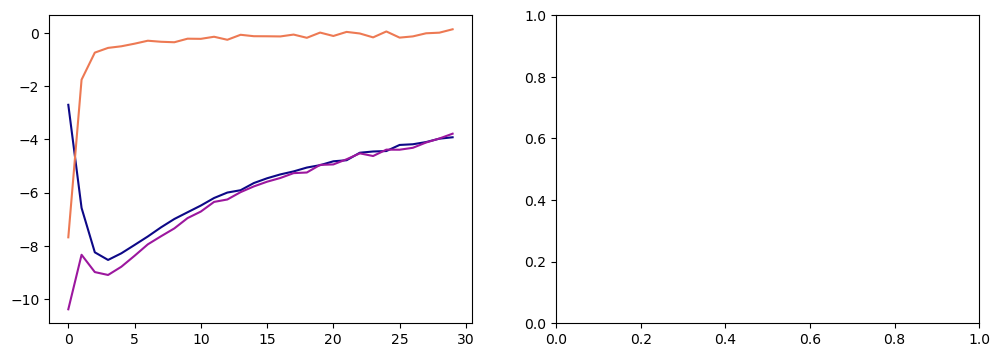

In [ ]:
cmap = mpl.cm.get_cmap('plasma')
num_colors = 4
colors = [cmap(i / (num_colors - 1)) for i in range(num_colors)]  # Evenly spaced in [0, 1]
mpl.rcParams['axes.prop_cycle'] = mpl.cycler(color=colors)

fig, ax = plt.subplots(ncols=2, figsize=(12,4))
ax[0].plot(data[freq]["1240"]["0"]["siv"][0,0,1000:1030].imag)
# ax[0].plot(data[freq]["1240"]["20"]["siv"][0,0,1000:1030].imag)
# ax[0].plot(data[freq]["1240"]["40"]["siv"][0,0,1000:1030].imag)
# ax[0].plot(data[freq]["1240"]["60"]["siv"][0,0,1000:1030].imag)
# ax[0].plot(data[freq]["1240"]["80"]["siv"][0,0,1000:1030].imag)
# ax[0].plot(data[freq]["1240"]["100"]["siv"][0,0,1000:1030].imag)
ax[0].plot(data[freq]["1240"]["60"]["siv"][0,0,1000:1030].imag)
# ax[0].plot(data[freq]["1240"]["60"]["siv"][0,0,1000:1030].imag - data[freq]["1240"]["0"]["siv"][0,0,1000:1030].imag)
ax[0].plot(data[freq]["1240"]["60"]["siv"][0,0,1000:1030].imag - data[freq]["1240"]["0"]["siv"][0,0,1000:1030].imag)

# ax[1].plot(data[freq]["1240"]["40"]["siv"][0,0,1000:1030].imag - data[freq]["1240"]["0"]["siv"][0,0,1000:1030].imag)
# ax[1].plot(data[freq]["1240"]["60"]["siv"][0,0,1000:1030].imag - data[freq]["1240"]["0"]["siv"][0,0,1000:1030].imag)
# ax[1].plot(data[freq]["1240"]["80"]["siv"][0,0,1000:1030].imag - data[freq]["1240"]["0"]["siv"][0,0,1000:1030].imag)
# ax[1].plot(data[freq]["1240"]["100"]["siv"][0,0,1000:1030].imag - data[freq]["1240"]["0"]["siv"][0,0,1000:1030].imag)
# ax[1].plot(data[freq]["1240"]["120"]["siv"][0,0,1000:1030].imag - data[freq]["1240"]["0"]["siv"][0,0,1000:1030].imag)

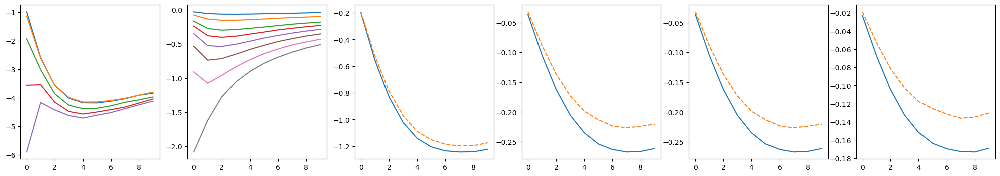

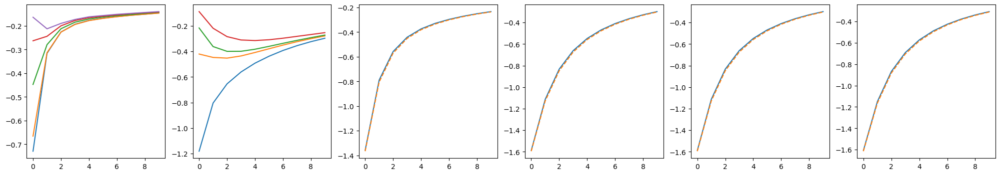

In [ ]:
vmax = 10

fig, ax = plt.subplots(ncols=6, figsize=(25,4))
fign=0
ax[fign].plot(data[freq]["920"]["0"]["siv"][0,0,1000:1000+vmax].imag)
ax[fign].plot(data[freq]["920"]["20"]["siv"][0,0,1000:1000+vmax].imag)
ax[fign].plot(data[freq]["920"]["40"]["siv"][0,0,1000:1000+vmax].imag)
ax[fign].plot(data[freq]["920"]["60"]["siv"][0,0,1000:1000+vmax].imag)
ax[fign].plot(data[freq]["920"]["80"]["siv"][0,0,1000:1000+vmax].imag)

fign=1
ax[fign].plot(data[freq]["80"]["80"]["siv"][0,0,1000:1000+vmax].imag)
ax[fign].plot(data[freq]["120"]["120"]["siv"][0,0,1000:1000+vmax].imag)
ax[fign].plot(data[freq]["160"]["160"]["siv"][0,0,1000:1000+vmax].imag)
ax[fign].plot(data[freq]["180"]["180"]["siv"][0,0,1000:1000+vmax].imag)
ax[fign].plot(data[freq]["200"]["200"]["siv"][0,0,1000:1000+vmax].imag)
ax[fign].plot(data[freq]["220"]["220"]["siv"][0,0,1000:1000+vmax].imag)
ax[fign].plot(data[freq]["240"]["240"]["siv"][0,0,1000:1000+vmax].imag)
ax[fign].plot(data[freq]["260"]["260"]["siv"][0,0,1000:1000+vmax].imag)
# ax[fign].plot(data[freq]["280"]["280"]["siv"][0,0,1000:1000+vmax].imag)
# ax[fign].plot(data[freq]["340"]["340"]["siv"][0,0,1000:1000+vmax].imag)
# ax[fign].plot(data[freq]["520"]["0"]["siv"][0,0,1000:1000+vmax].imag)
# ax[fign].plot(data[freq]["520"]["20"]["siv"][0,0,1000:1000+vmax].imag, "--")
# ax[fign].plot(data[freq]["520"]["40"]["siv"][0,0,1000:1000+vmax].imag)
# ax[fign].plot(data[freq]["520"]["60"]["siv"][0,0,1000:1000+vmax].imag)
# ax[fign].plot(data[freq]["520"]["80"]["siv"][0,0,1000:1000+vmax].imag)

fign=2
ax[fign].plot(data[freq]["440"]["0"]["siv"][0,0,1000:1000+vmax].imag)
ax[fign].plot(data[freq]["440"]["20"]["siv"][0,0,1000:1000+vmax].imag, "--")
# ax[fign].plot(data[freq]["520"]["40"]["siv"][0,0,1000:1000+vmax].imag)
# ax[fign].plot(data[freq]["520"]["60"]["siv"][0,0,1000:1000+vmax].imag)
# ax[fign].plot(data[freq]["520"]["80"]["siv"][0,0,1000:1000+vmax].imag)

fign=3
ax[fign].plot(data[freq]["120"]["0"]["siv"][0,0,1000:1000+vmax].imag)
ax[fign].plot(data[freq]["120"]["20"]["siv"][0,0,1000:1000+vmax].imag, "--")
# ax[fign].plot(data[freq]["520"]["40"]["siv"][0,0,1000:1000+vmax].imag)
# ax[fign].plot(data[freq]["520"]["60"]["siv"][0,0,1000:1000+vmax].imag)
# ax[fign].plot(data[freq]["520"]["80"]["siv"][0,0,1000:1000+vmax].imag)

fign=4
ax[fign].plot(data[freq]["120"]["0"]["siv"][0,0,1000:1000+vmax].imag)
ax[fign].plot(data[freq]["120"]["20"]["siv"][0,0,1000:1000+vmax].imag, "--")
# ax[fign].plot(data[freq]["520"]["40"]["siv"][0,0,1000:1000+vmax].imag)
# ax[fign].plot(data[freq]["520"]["60"]["siv"][0,0,1000:1000+vmax].imag)
# ax[fign].plot(data[freq]["520"]["80"]["siv"][0,0,1000:1000+vmax].imag)

fign=5
ax[fign].plot(data[freq]["80"]["0"]["siv"][0,0,1000:1000+vmax].imag)
ax[fign].plot(data[freq]["80"]["20"]["siv"][0,0,1000:1000+vmax].imag, "--")
# ax[fign].plot(data[freq]["520"]["40"]["siv"][0,0,1000:1000+vmax].imag)
# ax[fign].plot(data[freq]["520"]["60"]["siv"][0,0,1000:1000+vmax].imag)
# ax[fign].plot(data[freq]["520"]["80"]["siv"][0,0,1000:1000+vmax].imag)


fig, ax = plt.subplots(ncols=6, figsize=(25,4))
fign=0
ax[fign].plot(data[freq]["920"]["0"]["giv"][0,0,1000:1000+vmax].imag)
ax[fign].plot(data[freq]["920"]["20"]["giv"][0,0,1000:1000+vmax].imag)
ax[fign].plot(data[freq]["920"]["40"]["giv"][0,0,1000:1000+vmax].imag)
ax[fign].plot(data[freq]["920"]["60"]["giv"][0,0,1000:1000+vmax].imag)
ax[fign].plot(data[freq]["920"]["80"]["giv"][0,0,1000:1000+vmax].imag)

fign=1
ax[fign].plot(data[freq]["200"]["200"]["giv"][0,0,1000:1000+vmax].imag)
ax[fign].plot(data[freq]["260"]["260"]["giv"][0,0,1000:1000+vmax].imag)
ax[fign].plot(data[freq]["280"]["280"]["giv"][0,0,1000:1000+vmax].imag)
ax[fign].plot(data[freq]["340"]["340"]["giv"][0,0,1000:1000+vmax].imag)
# ax[fign].plot(data[freq]["520"]["0"]["giv"][0,0,1000:1000+vmax].imag)
# ax[fign].plot(data[freq]["520"]["20"]["giv"][0,0,1000:1000+vmax].imag, "--")
# ax[fign].plot(data[freq]["520"]["40"]["siv"][0,0,1000:1000+vmax].imag)
# ax[fign].plot(data[freq]["520"]["60"]["siv"][0,0,1000:1000+vmax].imag)
# ax[fign].plot(data[freq]["520"]["80"]["siv"][0,0,1000:1000+vmax].imag)

fign=2
ax[fign].plot(data[freq]["440"]["0"]["giv"][0,0,1000:1000+vmax].imag)
ax[fign].plot(data[freq]["440"]["20"]["giv"][0,0,1000:1000+vmax].imag, "--")
# ax[fign].plot(data[freq]["520"]["40"]["siv"][0,0,1000:1000+vmax].imag)
# ax[fign].plot(data[freq]["520"]["60"]["siv"][0,0,1000:1000+vmax].imag)
# ax[fign].plot(data[freq]["520"]["80"]["siv"][0,0,1000:1000+vmax].imag)

fign=3
ax[fign].plot(data[freq]["120"]["0"]["giv"][0,0,1000:1000+vmax].imag)
ax[fign].plot(data[freq]["120"]["20"]["giv"][0,0,1000:1000+vmax].imag, "--")
# ax[fign].plot(data[freq]["520"]["40"]["siv"][0,0,1000:1000+vmax].imag)
# ax[fign].plot(data[freq]["520"]["60"]["siv"][0,0,1000:1000+vmax].imag)
# ax[fign].plot(data[freq]["520"]["80"]["siv"][0,0,1000:1000+vmax].imag)

fign=4
ax[fign].plot(data[freq]["120"]["0"]["giv"][0,0,1000:1000+vmax].imag)
ax[fign].plot(data[freq]["120"]["20"]["giv"][0,0,1000:1000+vmax].imag, "--")
# ax[fign].plot(data[freq]["520"]["40"]["siv"][0,0,1000:1000+vmax].imag)
# ax[fign].plot(data[freq]["520"]["60"]["siv"][0,0,1000:1000+vmax].imag)
# ax[fign].plot(data[freq]["520"]["80"]["siv"][0,0,1000:1000+vmax].imag)

fign=5
ax[fign].plot(data[freq]["80"]["0"]["giv"][0,0,1000:1000+vmax].imag)
ax[fign].plot(data[freq]["80"]["20"]["giv"][0,0,1000:1000+vmax].imag, "--")
# ax[fign].plot(data[freq]["520"]["40"]["siv"][0,0,1000:1000+vmax].imag)
# ax[fign].plot(data[freq]["520"]["60"]["siv"][0,0,1000:1000+vmax].imag)
# ax[fign].plot(data[freq]["520"]["80"]["siv"][0,0,1000:1000+vmax].imag)


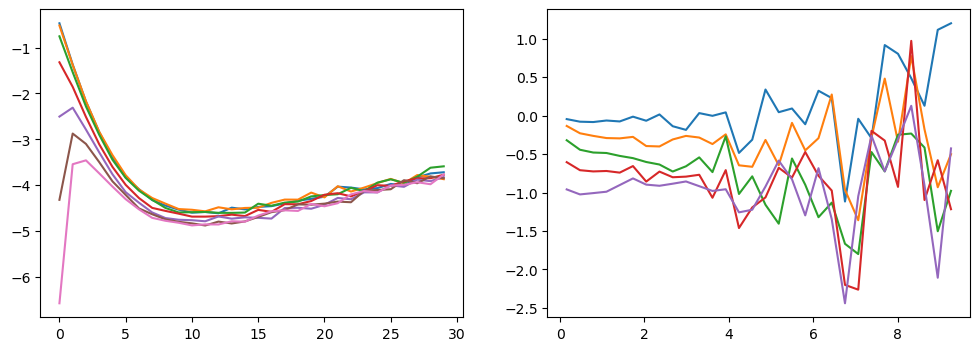

In [ ]:
fig, ax = plt.subplots(ncols=2, figsize=(12,4))
ax[0].plot(data[freq]["1240"]["0"]["siv"][0,0,1000:1030].imag)
ax[0].plot(data[freq]["1240"]["20"]["siv"][0,0,1000:1030].imag)
ax[0].plot(data[freq]["1240"]["40"]["siv"][0,0,1000:1030].imag)
ax[0].plot(data[freq]["1240"]["60"]["siv"][0,0,1000:1030].imag)
ax[0].plot(data[freq]["1240"]["80"]["siv"][0,0,1000:1030].imag)
ax[0].plot(data[freq]["1240"]["100"]["siv"][0,0,1000:1030].imag)
ax[0].plot(data[freq]["1240"]["120"]["siv"][0,0,1000:1030].imag)

ax[1].plot(iv[1000:1030], (data[freq]["1240"]["40"]["siv"][0,0,1000:1030].imag - data[freq]["1240"]["0"]["siv"][0,0,1000:1030].imag) * iv[1000:1030] )
ax[1].plot(iv[1000:1030], (data[freq]["1240"]["60"]["siv"][0,0,1000:1030].imag - data[freq]["1240"]["0"]["siv"][0,0,1000:1030].imag) * iv[1000:1030] )
ax[1].plot(iv[1000:1030], (data[freq]["1240"]["80"]["siv"][0,0,1000:1030].imag - data[freq]["1240"]["0"]["siv"][0,0,1000:1030].imag) * iv[1000:1030] )
ax[1].plot(iv[1000:1030], (data[freq]["1240"]["100"]["siv"][0,0,1000:1030].imag - data[freq]["1240"]["0"]["siv"][0,0,1000:1030].imag) * iv[1000:1030] )
ax[1].plot(iv[1000:1030], (data[freq]["1240"]["120"]["siv"][0,0,1000:1030].imag - data[freq]["1240"]["0"]["siv"][0,0,1000:1030].imag) * iv[1000:1030] )

G = 1 / (iv - hk + mu - 1/2U<n> )

In [ ]:
isozete = []
isoaim = 0.7
tol = 0.03
k = 0
c = [-1,-1,-1]
for u in U_st:
    m = 100
    l = 0
    for v in U_sc:
        if np.absolute(data_np[frequencies[0]]["Z"][k,l,2]-isoaim) < m:
            # print(k,l, data_np[frequencies[0]]["Z"][k,l,2])
            # m = np.absolute(data_np[frequencies[0]]["Z"][k,l,2]-isoaim)
            c = [u,v,data_np[frequencies[0]]["Z"][k,l,2]]
        l+=1
        isozete.append(c)
    k+=1
# print(isozete)    

# Refine
isozete_ref = []
for z in isozete:
    if abs(isoaim - z[2])<tol:
        isozete_ref.append(z)
    

print(isozete_ref)    
# isozete_ref = [[200, 200, 0.75], [360, 180, 0.75], [760, 140, 0.7]]
# print(isozete_ref)    

isozete_ref = [[680, 200, 0],[680, 180, 0],[680, 160, 0],[680, 140, 0],[680, 120, 0],[680, 100, 0],[680, 80, 0],[680, 60, 0],[680, 40, 0],[680, 20, 0],[680, 0, 0]]
# isozete_ref = [[1000, 120, 0],[919, 120, 0],[840, 120, 0],[760, 120, 0],[680, 120, 0],[600, 120, 0],[520, 120, 0],[440, 120, 0],[360, 120, 0],[280, 120, 0],[200, 120, 0]]
print(isozete_ref)    


In [ ]:
%%capture
import ana_cont.continuation as cont

beta = 20.
v_max = 100
wn = np.pi/beta * (2.*np.arange(v_max) + 1.)
w = np.linspace(-20., 20., num=501, endpoint=True)
iv = data[freq][str(U_st[0])][str(U_sc[0])]["iv"][1000:1000+v_max]

noise_amplitude = 1e-3
spectra = []
givs = []
sivs = []

for U in isozete_ref:
    print(U[0], U[1])
    giv = data[freq][str(U[0])][str(U[1])]["giv"][0,0,1000:1000+v_max]
    givs.append(giv)
    siv = data[freq][str(U[0])][str(U[1])]["siv"][0,0,1000:1000+v_max]
    sivs.append(siv)
    probl = cont.AnalyticContinuationProblem(im_axis=iv, re_axis=w,
                                            im_data=giv , kernel_mode='freq_fermionic')
    err = np.ones_like(wn)*noise_amplitude
    model = np.ones_like(w)
    model /= np.trapz(model, w)
    sol,_ = probl.solve(method='maxent_svd', alpha_determination='chi2kink', optimizer='newton', stdev=err, model=model)
    spectra.append(sol.A_opt)

givs = np.array(givs)
sivs = np.array(sivs)
isozete_ref = np.array(isozete_ref)
spectra = np.array(spectra)


In [ ]:
from matplotlib.backends.backend_pdf import PdfPages

sivs = np.array(sivs)
givs = np.array(givs)
isozete_ref = np.array(isozete_ref)
spectra = np.array(spectra)
v_max = 20
w_max = 10
l = "no info"#int(frequencies[0][4:])
pos_max = []
l = [0,4,8,10]

print(spectra.shape)

fig, ax = plt.subplots(ncols=3, nrows=spectra.shape[0], figsize=(18,spectra.shape[0]*4))
for n,s in enumerate(spectra[:]):
    # fig, ax = plt.subplots(ncols=3, nrows=1, figsize=(18,4))
    ax[n,0].plot(w, s, label=f"SzSz b/2= {data[freq][str(isozete_ref[n,0])][str(isozete_ref[n,1])]['szszb2']}")
    ax[n,0].set_xlim([-w_max,w_max])
    ax[n,0].legend()
    # title = freq[:2] + "=" + freq[3:]
    # ax[0].set_title(title)
    # ax[0].set_ylim([0, 1])

    # if (isozete_ref[n,0] - isozete_ref[n,1]) > 0:
    #     w0 = round(2 * l / (isozete_ref[n,0] - isozete_ref[n,1]), 2)
    # else:
    #     w0 = -1
    # print(np.argmax(s[250:])) 
    ax[n,1].plot(iv[:v_max], givs[n,:v_max].imag, label=f"Ustat = {int(isozete_ref[n,0])/100}, Uscr = {int(isozete_ref[n,1])/100}, Z = {isozete_ref[n,2]}, w = {2}, pos = {round(Decimal(w[250+np.argmax(s[250:])]),3)}")
    ax[n,1].set_title("Im$G(i\\nu)$")
    ax[n,1].legend()
    # print(str(isozete_ref[n,0]),str(isozete_ref[n,1]))
    ax[n,2].plot(iv[:v_max], sivs[n,:v_max].imag, label=f"SzSz = {data[freq][str(isozete_ref[n,0])][str(isozete_ref[n,1])]['szsz']}")
    ax[n,2].legend()
    ax[n,2].set_title("Im$\Sigma(i\\nu)$")
    
print(f'{frequencies[0]}_spectra_Z{isoaim}.pdf')
pp = PdfPages(f'{frequencies[0]}_spectra_Z{isoaim}.pdf')
plt.savefig(pp, format='pdf')
pp.close()

In [ ]:
def camera_position():
    fig.layout.scene1.camera = camera
    fig.layout.scene1.aspectratio=aspectratio

    fig.update_layout(
        title=r'Impurity Chi Charge',
        autosize=True,
        width=1900, height=600,
        margin=dict(l=10, r=5, b=0, t=35))
!pwd

def get_qnty(field, qnty):
    return np.array(field.get(qnty)).transpose()

In [ ]:
import plotly

import plotly.graph_objects as go
from plotly.subplots import make_subplots
from IPython.display import display, HTML

plotly.offline.init_notebook_mode()
display(HTML(
    '<script type="text/javascript" async src="https://cdnjs.cloudflare.com/ajax/libs/mathjax/2.7.1/MathJax.js?config=TeX-MML-AM_SVG"></script>'
))

min = 100
max = 400
c = 250
window = 490
marker_dict = dict(
        size=0.001,
        color='white',
        colorscale='Viridis',
    )
line_dict = []
line_dict.append(dict(
        color='darkblue',
        width=5
    )
)
line_dict.append(dict(
        color='blue',
        width=5
    )
)
line_dict.append(dict(
        color='pink',
        width=5
    )
)
line_dict.append(dict(
        color='orange',
        width=5
    )
)
line_dict.append(dict(
        color='red',
        width=5
    )
)
line_dict.append(dict(
        color='purple',
        width=5
    )
)
line_dict.append(dict(
        color='lightgreen',
        width=5
    )
)
line_dict.append(dict(
        color='green',
        width=5
    )
)
line_dict.append(dict(
        color='darkgreen',
        width=5
    )
)
line_dict.append(dict(
        color='gray',
        width=5
    )
)
line_dict.append(dict(
        color='black',
        width=5
    )
)

fig = go.Figure()
step = 0
for n,s in enumerate(spectra):
    x = np.zeros(s[min:max].shape[0]) + 2 + step
    fig.add_trace(
        go.Scatter3d(
        x=x, y=w[min:max], z=s[min:max],
        marker=marker_dict,
        line=line_dict[n],
        name=f"Uscr = {int(isozete_ref[n,1])/100}, Z = {isozete_ref[n,2]}, w = {2}, pos = {round(Decimal(w[250+np.argmax(s[250:])]),2)}",
    ))
    step -= 0.2

# camera_position()
fig.update_scenes(xaxis_title=r'',  
                  yaxis_title=r"")


fig.update_layout(
    title=r"$U_{stat} = 6.8$",
    width=1200,
    height=700,
    autosize=False,
    scene=dict(
        camera = dict(
            eye=dict(x=-1.5, y=-1.5, z=1.)
        ),
    #         eye=dict(
    #             x=0,
    #             y=1.0707,
    #             z=1,
    #         )
    #     ),
        aspectratio = dict( x=2, y=1, z=0.8 ),
        aspectmode = 'manual'
    ),
)
# camera = dict(
#     eye=dict(x=-0.5, y=-2.5, z=1.)
# )
# aspectratio = dict(x=1, y=1, z=1.5)

fig.show()
# fig.write_html("/mnt/data/BACKUP/daniel/Projects/DynamicalU_Susceptibility/PhaseSpace/file.html")


NameError: name 'spectra' is not defined

In [ ]:
fig = make_subplots(
    rows=1, cols=1,
    specs=[[{'type': 'surface'}]],
#     specs=[[{'type': 'surface'},{'type': 'surface'},{'type': 'surface'}],[{'type': 'surface'},{'type': 'surface'},{'type': 'surface'}]],
    subplot_titles=[])# , subplot_titles=(titles))

fig.add_trace(
go.Surface(z=spectra[:,230:270], colorscale='viridis', showscale=False),
row=1, col=1)



# fig.update_scenes(xaxis_title_text='U_static',  
#                   yaxis_title_text='U_screen')

# fig.update_yaxes(title_text="Date", row = 1, col = 1)

camera = dict(
    eye=dict(x=-0.5, y=-2.5, z=1.)
)
aspectratio = dict(x=1, y=1, z=1.5)
# camera_position()


fig.update_layout(
    # title=r'$\beta=20, \omega_0=4.0$',
    autosize=True,
    width=1500, height=800,
    margin=dict(l=10, r=5, b=0, t=35),
    # scene1 = dict(
    #     zaxis_title_text ="Z",
    # ),
    # scene2 = dict(
    #     zaxis_title_text="siv(1)-siv(0)",
    # ),
    # scene3 = dict(
    #     zaxis_title_text ="gtau(beta/2)",
    # ),
#     scene = dict(zaxis = dict(range=[-1,1],),),
)

# fig.write_html("/home/fs72150/springerd/Projects/DynamicalU/w4c0_beta20.html")


In [ ]:
data_np[freq]["Z"][:,:,2].shape

print(U_st)
print(U_sc)

In [ ]:
fig = make_subplots(
    rows=1, cols=3,
    specs=[[{'type': 'surface'},{'type': 'surface'},{'type': 'surface'}]],
#     specs=[[{'type': 'surface'},{'type': 'surface'},{'type': 'surface'}],[{'type': 'surface'},{'type': 'surface'},{'type': 'surface'}]],
    subplot_titles=[])# , subplot_titles=(titles))

fig.add_trace(
go.Surface(x=np.array(U_sc)/100,y=np.array(data_alt_np_Z[0,:,2])/100, z=(data_alt_np_Z[:,:,0]).transpose(), colorscale='viridis', showscale=False),
row=1, col=1)

fig.add_trace(
go.Surface(x=U_st, y=U_sc, z=data_np[freq]["siv_diff"][:,:,2].imag, colorscale='viridis', showscale=False),
# go.Surface(x=U_st, y=U_sc, z=data_np["alpha"][:,:,2], colorscale='viridis', showscale=False),
row=1, col=2)

fig.add_trace(
go.Surface(x=U_st, y=U_sc, z=data_np[freq]["gtaubetahalf"][:,:,2], colorscale='viridis', showscale=False),
row=1, col=3)


fig.update_scenes(xaxis_title_text='U_static',  
                  yaxis_title_text='U_screen')


camera = dict(
    eye=dict(x=-0.5, y=-2.5, z=1.)
)
aspectratio = dict(x=1, y=1, z=1.5)
# camera_position()


fig.update_layout(
    title=r'$\beta=20, \omega_0=4.0$',
    autosize=True,
    width=1500, height=800,
    margin=dict(l=10, r=5, b=0, t=35),
    scene1 = dict(
        zaxis_title_text ="Z",
    ),
    scene2 = dict(
        zaxis_title_text="siv(1)-siv(0)",
    ),
    scene3 = dict(
        zaxis_title_text ="gtau(beta/2)",
    ),
#     scene = dict(zaxis = dict(range=[-1,1],),),
)

# fig.write_html("/home/fs72150/springerd/Projects/DynamicalU/w4c0_beta20.html")


In [ ]:
fig = make_subplots(
    rows=1, cols=1,
    specs=[[{'type': 'surface'}]],
#     specs=[[{'type': 'surface'},{'type': 'surface'},{'type': 'surface'}],[{'type': 'surface'},{'type': 'surface'},{'type': 'surface'}]],
    subplot_titles=[])# , subplot_titles=(titles))

fig.add_trace(
go.Surface(x=np.array(U_sc)/100,y=np.array(data_alt_np_Z[0,:,2])/100, z=(data_alt_np_Z[:,:,0]).transpose(), colorscale='viridis', showscale=False),
row=1, col=1)



fig.update_scenes(xaxis_title_text='U_static',  
                  yaxis_title_text='U_screen')


camera = dict(
    eye=dict(x=-0.5, y=-2.5, z=1.)
)
aspectratio = dict(x=1, y=1, z=1.5)
# camera_position()


fig.update_layout(
    title=r'$\beta=20, \omega_0=4.0$',
    autosize=True,
    width=1000, height=700,
    margin=dict(l=10, r=5, b=0, t=35),
    scene1 = dict(
        zaxis_title_text ="Z",
    ),
    # scene2 = dict(
    #     zaxis_title_text="siv(1)-siv(0)",
    # ),
    # scene3 = dict(
    #     zaxis_title_text ="gtau(beta/2)",
    # ),
#     scene = dict(zaxis = dict(range=[-1,1],),),
)

# fig.write_html("/home/fs72150/springerd/Projects/DynamicalU/w4c0_beta20.html")
